# Stage 1 — Optuna Hyperparameter Search (ALL Signals, 2000 Epochs, Per-subject Norm)
Cross-dataset: CATSA (train/val) → EmpaticaE4 (test)  
Signal: ALL @ 32 Hz, window=60s (1920 samples), stride=10s (320 samples)  
Channels: ACC_X, ACC_Y, ACC_Z, EDA, HR, HRV, TEMP (7 ch)  
Objective: maximise val-F1 (NopPruner, 15 trials / model)  
Storage: SQLite (resumable)  
**Loss**: BCEWithLogitsLoss(pos_weight) | **Epochs**: 2000 | **Early Stopping**: Optuna patience (50–100)

In [1]:
import sys, warnings, json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import optuna
from optuna.samplers import TPESampler
from optuna.pruners import NopPruner

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

torch.set_float32_matmul_precision('high')
torch.backends.cudnn.benchmark = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
USE_BF16 = torch.cuda.is_available()
print(f'Device: {DEVICE}  |  BF16: {USE_BF16}')

Device: cuda  |  BF16: True


/home/binghin2/miniconda3/envs/myenv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# ── Configuration ────────────────────────────────────────────────────────────
MODELS = [
    'TimeMixerPP', 'Medformer', 'TSLANet', 'ModernTCN',
    'CrossGNN', 'TimesNet', 'Mamba2', 'iTransformer', 'PatchTST', 'Chronos2', 'TransformerCNN',
]

SIGNAL     = 'ALL'
FS         = 32
WIN_SEC    = 60
STRIDE_SEC = 10
W          = FS * WIN_SEC      # 1920
STRIDE     = FS * STRIDE_SEC   # 320
N_CHANNELS = 7
TASKS        = ['Baseline', 'Logic', 'Nback', 'Stroop', 'Sudoku']
STRESS_TASKS = {'Logic', 'Nback', 'Stroop', 'Sudoku'}

VAL_RATIO = 0.10
EPOCHS    = 2000
# Early stopping: patience sampled by Optuna (50–100)

N_TRIALS  = 15

DATA_ROOT = Path('/home/binghin2/Myproject/Dataset/CATSA')
SAVE_DIR  = Path('Save_model_ALL_Norm')
SAVE_DIR.mkdir(exist_ok=True)
DB_PATH   = SAVE_DIR / 'optuna_studies.db'
STORAGE   = f'sqlite:///{DB_PATH}'

print(f'W={W}, stride={STRIDE}, channels={N_CHANNELS}, EPOCHS={EPOCHS}, save → {SAVE_DIR}')

W=1920, stride=320, channels=7, EPOCHS=2000, save → Save_model_ALL_Norm


In [3]:
# ── Data utilities ───────────────────────────────────────────────────────────
import re


def discover_subjects(root: Path) -> list[Path]:
    return sorted([p for p in root.iterdir() if p.is_dir() and re.match(r'Sub\d+', p.name)])


def _is_numeric_like(value) -> bool:
    try:
        float(str(value).strip())
        return True
    except Exception:
        return False


def _read_csv_auto(path: Path) -> pd.DataFrame:
    df = pd.read_csv(path)
    if len(df.columns) > 0 and all(_is_numeric_like(c) for c in df.columns):
        df = pd.read_csv(path, header=None)
    return df


def read_acc(path: Path) -> np.ndarray:
    df = _read_csv_auto(path)
    if {'ACC_X', 'ACC_Y', 'ACC_Z'}.issubset(df.columns):
        values = df[['ACC_X', 'ACC_Y', 'ACC_Z']].to_numpy(np.float32)
    else:
        values = df.iloc[:, :3].apply(pd.to_numeric, errors='coerce').to_numpy(np.float32)
    return values[~np.isnan(values).any(axis=1)]


def read_series(path: Path, preferred_col: str | None = None) -> np.ndarray:
    df = _read_csv_auto(path)
    if preferred_col and preferred_col in df.columns:
        series = df[preferred_col]
    else:
        numeric_cols = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c])]
        if numeric_cols:
            series = df[numeric_cols[0]]
        else:
            series = df.iloc[:, 0]
    values = pd.to_numeric(series, errors='coerce').to_numpy(np.float32)
    return values[~np.isnan(values)]


def resample_1d(sig: np.ndarray, target_len: int) -> np.ndarray:
    sig = np.asarray(sig, dtype=np.float32)
    if target_len <= 0:
        return np.empty(0, np.float32)
    if sig.size == 0:
        return np.zeros(target_len, np.float32)
    if len(sig) == target_len:
        return sig.astype(np.float32, copy=False)
    x_old = np.linspace(0.0, 1.0, len(sig), dtype=np.float32)
    x_new = np.linspace(0.0, 1.0, target_len, dtype=np.float32)
    return np.interp(x_new, x_old, sig).astype(np.float32)


def resample_2d(sig: np.ndarray, target_len: int) -> np.ndarray:
    sig = np.asarray(sig, dtype=np.float32)
    if sig.size == 0:
        return np.empty((0, 0), np.float32)
    return np.stack(
        [resample_1d(sig[:, idx], target_len) for idx in range(sig.shape[1])], axis=1
    ).astype(np.float32)


def detect_hrv_from_hr(hr: np.ndarray, hrv_window: int = 5) -> np.ndarray:
    hr = np.asarray(hr, dtype=np.float32)
    if hr.size == 0:
        return hr
    hr = np.clip(hr, 1e-3, None)

    rr_ms = 60000.0 / hr
    drr = np.abs(np.diff(rr_ms, prepend=rr_ms[0]))
    w = max(1, int(hrv_window))
    kernel = np.ones(w, dtype=np.float32) / float(w)

    rmssd = np.sqrt(np.convolve(drr * drr, kernel, mode='same') + 1e-8)
    rr_mean = np.convolve(rr_ms, kernel, mode='same')
    rr_sq_mean = np.convolve(rr_ms * rr_ms, kernel, mode='same')
    sdnn = np.sqrt(np.maximum(rr_sq_mean - rr_mean * rr_mean, 0.0) + 1e-8)

    hrv = 0.5 * rmssd + 0.5 * sdnn
    return hrv.astype(np.float32)


def load_modalities(task_dir: Path) -> np.ndarray:
    acc = read_acc(task_dir / 'ACC.csv')
    eda = read_series(task_dir / 'EDA.csv', 'EDA')
    hr_raw = read_series(task_dir / 'HR.csv', 'HR')
    temp = read_series(task_dir / 'TEMP.csv', 'TEMP')

    if min(len(acc), len(eda), len(hr_raw), len(temp)) == 0:
        raise RuntimeError(f'missing modality data in {task_dir}')

    target_len = len(acc)
    hrv_raw = detect_hrv_from_hr(hr_raw)

    acc = acc.astype(np.float32)
    eda = resample_1d(eda, target_len)
    hr = resample_1d(hr_raw, target_len)
    hrv = resample_1d(hrv_raw, target_len)
    temp = resample_1d(temp, target_len)

    return np.vstack([
        acc.T,
        eda[None, :],
        hr[None, :],
        hrv[None, :],
        temp[None, :],
    ]).astype(np.float32)


def make_windows_3d(sig: np.ndarray, w: int, stride: int) -> np.ndarray:
    if sig.shape[-1] < w:
        return np.empty((0, sig.shape[0], w), np.float32)
    return np.asarray([
        sig[:, i:i + w] for i in range(0, sig.shape[-1] - w + 1, stride)
    ], dtype=np.float32)


def build_all_arrays(root: Path, w: int, stride: int, val_ratio: float = 0.10):
    xs, ys = [], []
    skipped = []
    for sub in discover_subjects(root):
        try:
            task_sigs = {task: load_modalities(sub / task) for task in TASKS}
            # Per-subject normalization across all tasks
            all_sig = np.concatenate(list(task_sigs.values()), axis=1)
            mu    = np.mean(all_sig, axis=1, keepdims=True)
            sigma = np.std(all_sig,  axis=1, keepdims=True) + 1e-8
            for task, sig in task_sigs.items():
                norm = (sig - mu) / sigma
                x = make_windows_3d(norm, w, stride)
                if len(x):
                    xs.append(x)
                    ys.append(np.full(len(x), int(task in STRESS_TASKS), np.int64))
        except Exception as e:
            skipped.append(f'{sub.name}: {e}')
    if skipped:
        print('Skipped subjects:')
        for item in skipped[:10]:
            print(f'  {item}')
        if len(skipped) > 10:
            print(f'  ... and {len(skipped) - 10} more')
    if not xs:
        raise RuntimeError(f'No CATSA data could be loaded from {root}')
    X = np.concatenate(xs)
    Y = np.concatenate(ys)
    split = max(1, int(len(X) * (1 - val_ratio)))
    return X[:split], Y[:split], X[split:], Y[split:]


print('Data utilities defined.')

Data utilities defined.


In [4]:
# ── E4 data loading (test only - never used for train/val) ───────────────────
E4_ROOT = Path('/home/binghin2/Myproject/Dataset/EmpaticaE4Stress/Subjects')
SUBJECTS_E4 = [f'subject_{i:02d}' for i in range(1, 7)]


def build_e4_labels(n: int, fs: int = FS):
    fixed_s = {
        'rest0': 180, 'task1': 600, 'rest1': 120, 'task2': 300,
        'rest2': 120, 'task3': 180, 'rest3': 120, 'rest4': 120,
        'task5': 60,  'rest5': 120,
    }
    total_fixed_s = sum(fixed_s.values())
    task4_s = max(0, n // fs - total_fixed_s)
    segs = [
        ('rest0', 180, 0), ('task1', 600, 1), ('rest1', 120, -1),
        ('task2', 300, 1), ('rest2', 120, -1), ('task3', 180, 1),
        ('rest3', 120, -1), ('task4', task4_s, 1), ('rest4', 120, -1),
        ('task5', 60, 1), ('rest5', 120, -1),
    ]
    labels = np.full(n, -1, dtype=np.int64)
    cur = 0
    for _, dur_s, lab in segs:
        if dur_s <= 0:
            continue
        end = min(cur + dur_s * fs, n)
        if end > cur:
            labels[cur:end] = lab
        cur = end
        if cur >= n:
            break
    return labels, int(task4_s)


def load_e4_modalities(subject_dir: Path) -> np.ndarray:
    acc    = read_acc(subject_dir / 'ACC.csv')
    eda    = read_series(subject_dir / 'EDA.csv', 'EDA')
    hr_raw = read_series(subject_dir / 'HR.csv', 'HR')
    temp   = read_series(subject_dir / 'TEMP.csv', 'TEMP')

    if min(len(acc), len(eda), len(hr_raw), len(temp)) == 0:
        raise RuntimeError(f'missing modality data in {subject_dir}')

    target_len = len(acc)
    hrv_raw = detect_hrv_from_hr(hr_raw)

    acc  = acc.astype(np.float32)
    eda  = resample_1d(eda, target_len)
    hr   = resample_1d(hr_raw, target_len)
    hrv  = resample_1d(hrv_raw, target_len)
    temp = resample_1d(temp, target_len)

    return np.vstack([
        acc.T,
        eda[None, :],
        hr[None, :],
        hrv[None, :],
        temp[None, :],
    ]).astype(np.float32)


def e4_windows(sig: np.ndarray, labels: np.ndarray, W: int, S: int):
    mask  = labels >= 0
    mu    = np.mean(sig[:, mask], axis=1, keepdims=True) if mask.any() else np.mean(sig, axis=1, keepdims=True)
    sigma = np.std(sig[:, mask],  axis=1, keepdims=True) + 1e-8 if mask.any() else np.std(sig, axis=1, keepdims=True) + 1e-8
    norm = ((sig - mu) / sigma).astype(np.float32)
    xs, ys = [], []
    for i in range(0, norm.shape[-1] - W + 1, S):
        u = np.unique(labels[i:i + W])
        if len(u) == 1 and u[0] in (0, 1):
            xs.append(norm[:, i:i + W])
            ys.append(int(u[0]))
    if not xs:
        return np.empty((0, N_CHANNELS, W), np.float32), np.empty(0, np.int64)
    return np.asarray(xs, np.float32), np.asarray(ys, np.int64)


e4_data_per_subject = {}
for sub in SUBJECTS_E4:
    sig = load_e4_modalities(E4_ROOT / sub)
    labels, _ = build_e4_labels(sig.shape[-1], fs=FS)
    x, y = e4_windows(sig, labels, W, STRIDE)
    e4_data_per_subject[sub] = (x, y)
    print(f'{sub}: {len(x)} windows')

subject_01: 159 windows
subject_02: 144 windows
subject_03: 116 windows
subject_04: 119 windows
subject_05: 117 windows
subject_06: 125 windows


In [5]:
# ── Load ALL data (once, shared across all models) ────────────────────────────
print('Loading ALL data...', end=' ')
x_train, y_train, x_val, y_val = build_all_arrays(DATA_ROOT, W, STRIDE, VAL_RATIO)
print(f'done.  train={x_train.shape}  val={x_val.shape}')

n_stress    = (y_train == 1).sum()
n_nonstress = (y_train == 0).sum()
POS_WEIGHT  = float(n_stress / n_nonstress)
print(f'Stress={n_stress}, Non-stress={n_nonstress}, pos_weight={POS_WEIGHT:.3f}')

Loading ALL data... done.  train=(2925, 7, 1920)  val=(325, 7, 1920)
Stress=2340, Non-stress=585, pos_weight=4.000


In [6]:
# ── Chronos-2 pipeline (optional) ────────────────────────────────────────────
chronos_pipeline = None
try:
    from chronos import ChronosPipeline
    chronos_pipeline = ChronosPipeline.from_pretrained(
        'amazon/chronos-t5-small',
        device_map=str(DEVICE),
        torch_dtype=torch.float32,
    )
    print('Chronos-2 pipeline loaded.')
except Exception as e:
    print(f'Chronos-2 unavailable: {e}')
    MODELS = [m for m in MODELS if m != 'Chronos2']
    print(f'Running without Chronos2. Models: {MODELS}')

Chronos-2 unavailable: Could not import module 'PreTrainedModel'. Are this object's requirements defined correctly?
Running without Chronos2. Models: ['TimeMixerPP', 'Medformer', 'TSLANet', 'ModernTCN', 'CrossGNN', 'TimesNet', 'Mamba2', 'iTransformer', 'PatchTST', 'TransformerCNN']


In [7]:
# ── Import models and shared utils ───────────────────────────────────────────
sys.path.insert(0, str(Path('.').resolve()))

from ALL_optuna_utils import (
    evaluate_on_e4, finalize_best_checkpoint,
    sample_hp, set_seed, seed_worker,
    generate_stage1_summary, save_per_subject_results,
    plot_stage1_comparison, plot_per_subject_heatmap, save_hp_importance_plots,
)
from ALL_models_ten import build_model

_ = build_model('TimeMixerPP', W=W, n_channels=N_CHANNELS)
print('ALL_models_ten.py imported OK.')

ALL_models_ten.py imported OK.


In [8]:
# ── Per-trial utilities ───────────────────────────────────────────────────────

@torch.no_grad()
def _val_metrics(model, loader, criterion, use_bf16, device):
    """Returns (val_loss, val_acc, val_f1)."""
    model.eval()
    total_loss = 0.0
    n_batches  = 0
    all_pred, all_true = [], []
    for xb, yb in loader:
        xb   = xb.to(device, non_blocking=True)
        yb_d = yb.to(device, non_blocking=True)
        if use_bf16:
            with torch.autocast('cuda', dtype=torch.bfloat16):
                logits = model(xb)
                loss   = criterion(logits, yb_d.float())
        else:
            logits = model(xb)
            loss   = criterion(logits, yb_d.float())
        total_loss += loss.item()
        n_batches  += 1
        preds = (logits.float().sigmoid() >= 0.5).long().cpu()
        all_pred.append(preds)
        all_true.append(yb)
    y_pred = torch.cat(all_pred).numpy()
    y_true = torch.cat(all_true).numpy()
    val_loss = total_loss / max(n_batches, 1)
    val_acc  = float((y_pred == y_true).mean())
    tp  = int(((y_pred == 1) & (y_true == 1)).sum())
    fp  = int(((y_pred == 1) & (y_true == 0)).sum())
    fn  = int(((y_pred == 0) & (y_true == 1)).sum())
    prec   = tp / (tp + fp + 1e-8)
    rec    = tp / (tp + fn + 1e-8)
    val_f1 = float(2 * prec * rec / (prec + rec + 1e-8))
    return val_loss, val_acc, val_f1


def make_objective_2000(
    model_name, x_train, y_train, x_val, y_val,
    W, n_channels, pos_weight, device, save_dir,
    epochs=2000, chronos_pipeline=None,
):
    """
    Objective with early stopping (patience sampled by Optuna) + BCEWithLogitsLoss(pos_weight).
    Returns (objective, best_f1_ref, best_hp_ref, trial_histories)
    """
    save_dir   = Path(save_dir)
    is_chronos = (model_name == 'Chronos2')
    use_bf16   = (not is_chronos) and torch.cuda.is_available()

    best_f1_ref: list[float] = [-1.0]
    best_hp_ref: list[dict]  = [{}]
    trial_histories: dict    = {}

    tmp_dir = save_dir / 'tmp_checkpoints' / model_name
    tmp_dir.mkdir(parents=True, exist_ok=True)

    xt = torch.from_numpy(x_train).float()
    yt = torch.from_numpy(y_train).long()
    xv = torch.from_numpy(x_val).float()
    yv = torch.from_numpy(y_val).long()
    val_ds = TensorDataset(xv, yv)

    def objective(trial: optuna.Trial) -> float:
        set_seed(42)
        hp       = sample_hp(trial, model_name)
        bs       = int(hp.pop('bs'))
        lr       = float(hp.pop('lr'))
        wd       = float(hp.pop('wd'))
        patience = trial.suggest_int('patience', 50, 100)

        g = torch.Generator()
        g.manual_seed(42)
        train_ds     = TensorDataset(xt, yt)
        train_loader = DataLoader(train_ds, batch_size=bs, shuffle=True,
                                  num_workers=2, pin_memory=True, drop_last=True,
                                  worker_init_fn=seed_worker, generator=g)
        val_loader   = DataLoader(val_ds,   batch_size=bs, shuffle=False,
                                  num_workers=2, pin_memory=True,
                                  worker_init_fn=seed_worker, generator=g)

        if is_chronos:
            if chronos_pipeline is None:
                raise optuna.TrialPruned()
            model = build_model(model_name, W=W, n_channels=n_channels,
                                pipeline=chronos_pipeline, **hp)
            enc_params, head_params = [], []
            for n, p in model.named_parameters():
                if p.requires_grad:
                    (enc_params if 'head' not in n else head_params).append(p)
            optimizer = torch.optim.AdamW([
                {'params': enc_params,  'lr': lr * 0.1},
                {'params': head_params, 'lr': lr},
            ], weight_decay=wd)
        else:
            model     = build_model(model_name, W=W, n_channels=n_channels, **hp)
            optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)

        model     = model.to(device)
        pw        = torch.tensor([pos_weight], dtype=torch.float32, device=device)
        criterion = nn.BCEWithLogitsLoss(pos_weight=pw)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=epochs, eta_min=lr * 0.01)

        best_f1    = -1.0
        no_improve = 0
        ckpt_path  = tmp_dir / f'trial_{trial.number}.pt'
        trial_histories[trial.number] = {'train_loss': [], 'val_loss': [], 'val_acc': []}

        for epoch in range(epochs):
            # ── train ──
            model.train()
            epoch_loss = 0.0
            n_batches  = 0
            for xb, yb in train_loader:
                xb = xb.to(device, non_blocking=True)
                yb = yb.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                if use_bf16:
                    with torch.autocast('cuda', dtype=torch.bfloat16):
                        loss = criterion(model(xb), yb.float())
                else:
                    loss = criterion(model(xb), yb.float())
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                epoch_loss += loss.item()
                n_batches  += 1
            scheduler.step()

            train_loss_ep = epoch_loss / max(n_batches, 1)

            # ── validate ──
            val_loss_ep, val_acc_ep, val_f1_ep = _val_metrics(
                model, val_loader, criterion,
                use_bf16 and not is_chronos, device)

            trial_histories[trial.number]['train_loss'].append(train_loss_ep)
            trial_histories[trial.number]['val_loss'].append(val_loss_ep)
            trial_histories[trial.number]['val_acc'].append(val_acc_ep)

            trial.report(val_f1_ep, epoch)

            if val_f1_ep > best_f1:
                best_f1    = val_f1_ep
                no_improve = 0
                torch.save({
                    'model_state_dict': model.state_dict(),
                    'hp': {**hp, 'lr': lr, 'wd': wd, 'bs': bs, 'patience': patience},
                    'epoch': epoch,
                    'val_f1': val_f1_ep,
                    'trial_number': trial.number,
                    'model_name': model_name,
                }, ckpt_path)
            else:
                no_improve += 1
                if no_improve >= patience:
                    break

        if best_f1 > best_f1_ref[0]:
            best_f1_ref[0] = best_f1
            best_hp_ref[0] = {**hp, 'lr': lr, 'wd': wd, 'bs': bs, 'patience': patience}

        del model
        torch.cuda.empty_cache()
        return best_f1

    return objective, best_f1_ref, best_hp_ref, trial_histories


def make_callbacks(model_name: str, trial_histories: dict):
    """Progress log + per-trial loss/accuracy plot."""
    def callback(study: optuna.Study, trial: optuna.Trial):
        n_done   = len([t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE])
        n_pruned = len([t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED])
        best_val = study.best_value if study.best_trial is not None else float('nan')
        val_str  = f'{trial.value:.4f}' if trial.value is not None else 'pruned'
        print(f'  [{model_name}] trial {trial.number:>2d} ({trial.state.name:<9s}) '
              f'val_f1={val_str}  best={best_val:.4f}  '
              f'(done={n_done}, pruned={n_pruned})')

        history      = trial_histories.get(trial.number, {})
        train_losses = history.get('train_loss', [])
        val_losses   = history.get('val_loss',   [])
        val_accs     = history.get('val_acc',    [])

        if not train_losses:
            return

        ep = range(1, len(train_losses) + 1)
        fig, ax1 = plt.subplots(figsize=(13, 4))

        ax1.plot(ep, train_losses, color='steelblue', linewidth=1.2, label='Train Loss')
        ax1.plot(ep, val_losses,   color='tomato',    linewidth=1.2, label='Val Loss')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.legend(loc='upper left')
        ax1.grid(True, alpha=0.3)

        ax2 = ax1.twinx()
        ax2.plot(ep, val_accs, color='seagreen', linewidth=1.2,
                 linestyle='--', label='Val Accuracy')
        ax2.set_ylabel('Accuracy', color='seagreen')
        ax2.tick_params(axis='y', labelcolor='seagreen')
        ax2.set_ylim(0, 1.05)
        ax2.legend(loc='upper right')

        title = f'{model_name}  Trial {trial.number}'
        if trial.value is not None:
            title += f'  |  best val_f1 = {trial.value:.4f}'
        ax1.set_title(title)

        plt.tight_layout()
        plt.show()

    return callback


print('_val_metrics / make_objective_2000 / make_callbacks defined.')

_val_metrics / make_objective_2000 / make_callbacks defined.



 Model: TimeMixerPP   study: stage1_Norm_TimeMixerPP
  Resuming from trial 0, running 15 more.
  [TimeMixerPP] trial  0 (COMPLETE ) val_f1=0.9506  best=0.9506  (done=1, pruned=0)


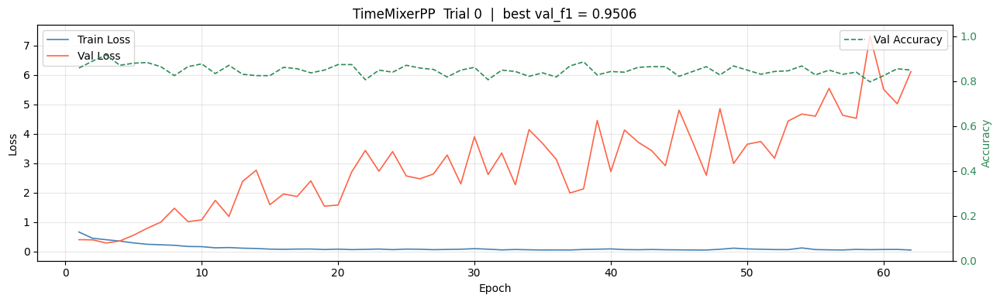

  [TimeMixerPP] trial  1 (COMPLETE ) val_f1=0.9519  best=0.9519  (done=2, pruned=0)


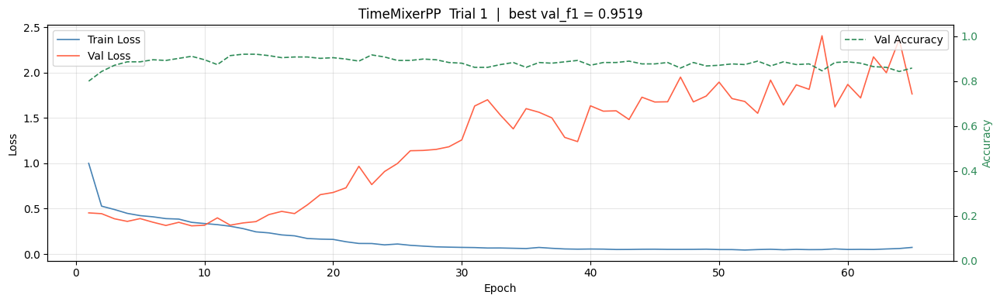

  [TimeMixerPP] trial  2 (COMPLETE ) val_f1=0.9457  best=0.9519  (done=3, pruned=0)


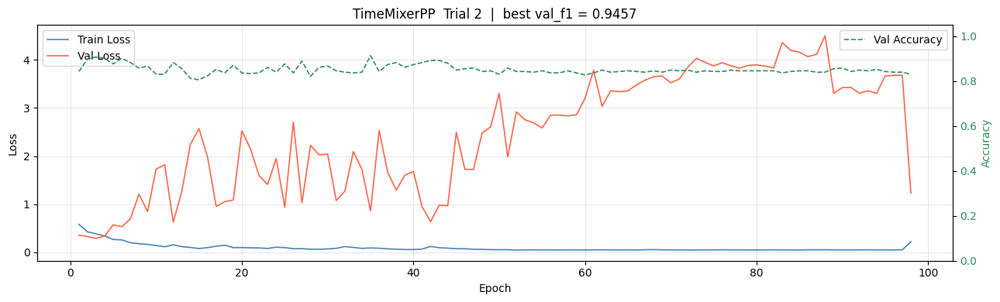

  [TimeMixerPP] trial  3 (COMPLETE ) val_f1=0.9554  best=0.9554  (done=4, pruned=0)


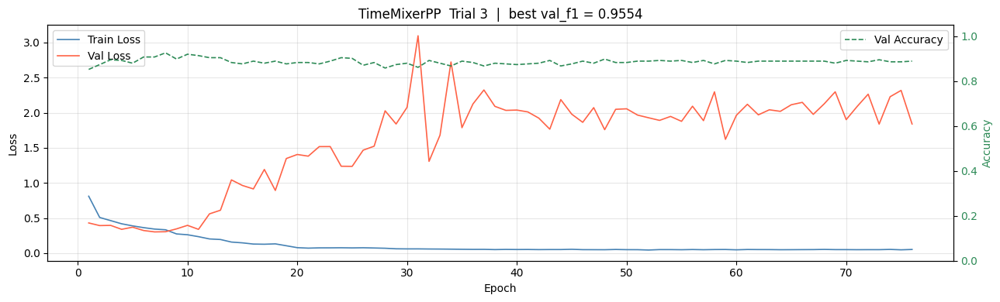

  [TimeMixerPP] trial  4 (COMPLETE ) val_f1=0.9501  best=0.9554  (done=5, pruned=0)


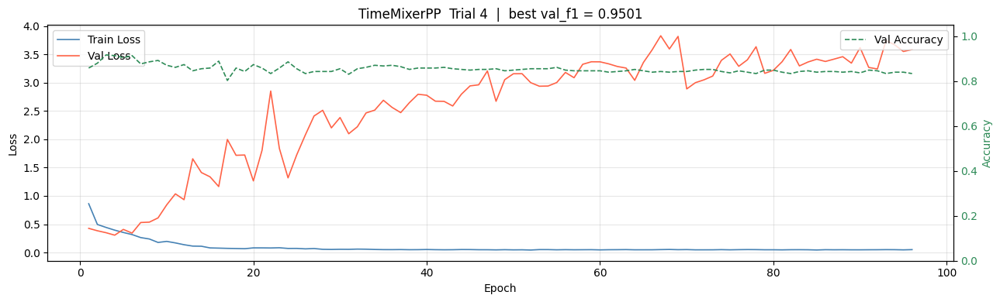

  [TimeMixerPP] trial  5 (COMPLETE ) val_f1=0.9420  best=0.9554  (done=6, pruned=0)


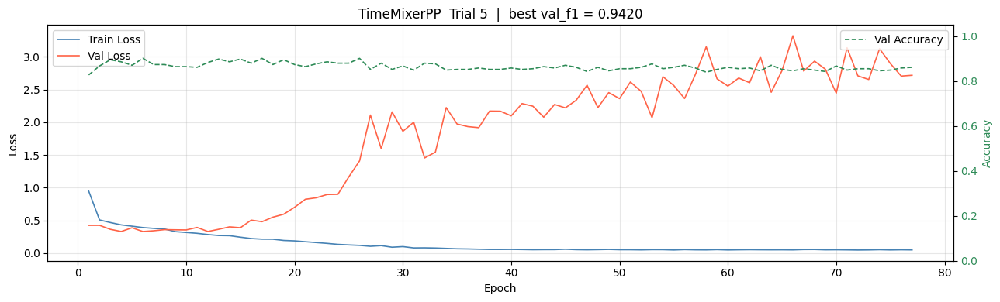

  [TimeMixerPP] trial  6 (COMPLETE ) val_f1=0.9427  best=0.9554  (done=7, pruned=0)


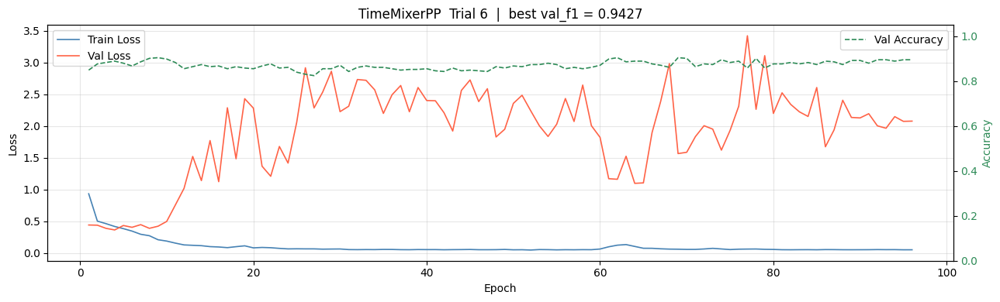

  [TimeMixerPP] trial  7 (COMPLETE ) val_f1=0.9524  best=0.9554  (done=8, pruned=0)


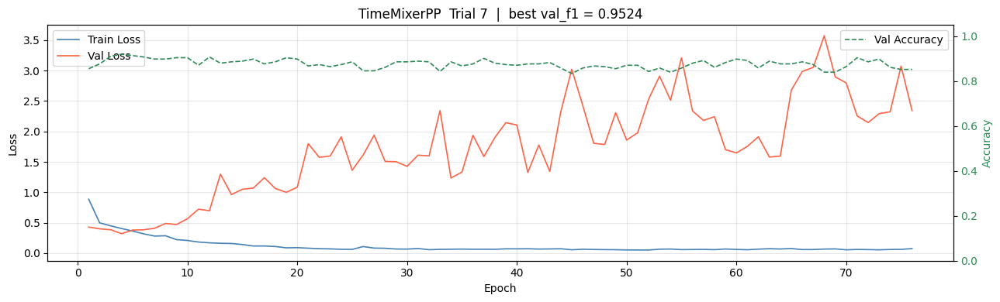

  [TimeMixerPP] trial  8 (COMPLETE ) val_f1=0.9541  best=0.9554  (done=9, pruned=0)


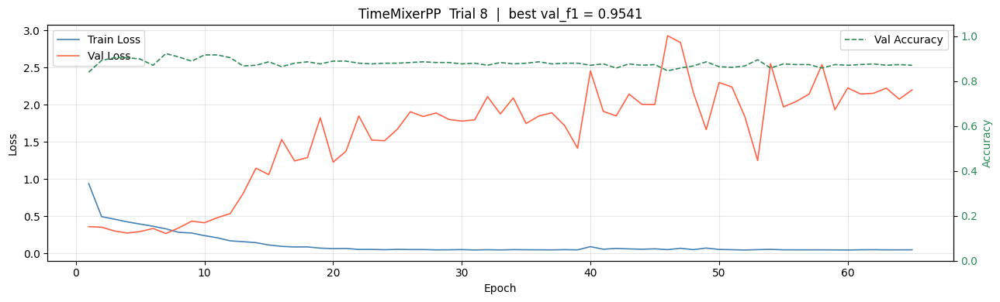

  [TimeMixerPP] trial  9 (COMPLETE ) val_f1=0.9455  best=0.9554  (done=10, pruned=0)


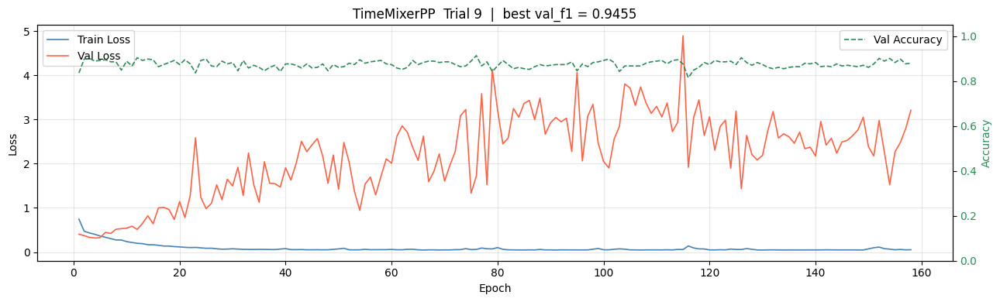

  [TimeMixerPP] trial 10 (COMPLETE ) val_f1=0.9565  best=0.9565  (done=11, pruned=0)


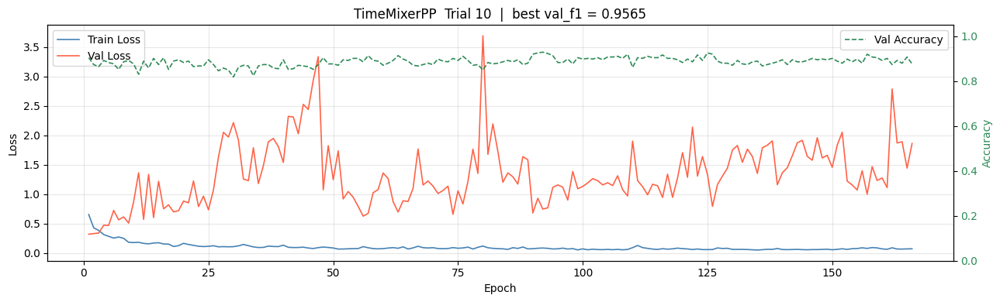

  [TimeMixerPP] trial 11 (COMPLETE ) val_f1=0.9576  best=0.9576  (done=12, pruned=0)


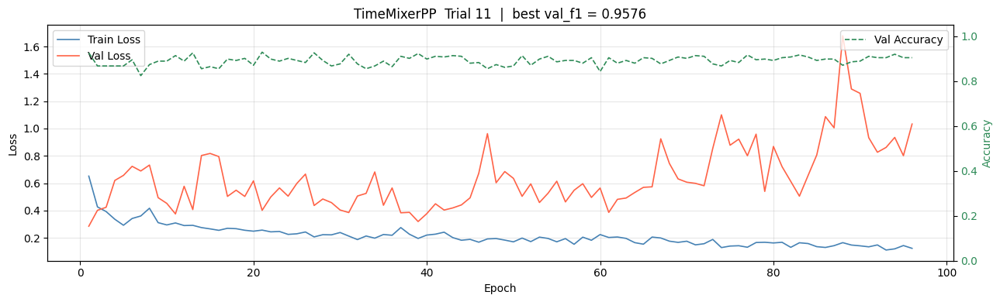

  [TimeMixerPP] trial 12 (COMPLETE ) val_f1=0.9449  best=0.9576  (done=13, pruned=0)


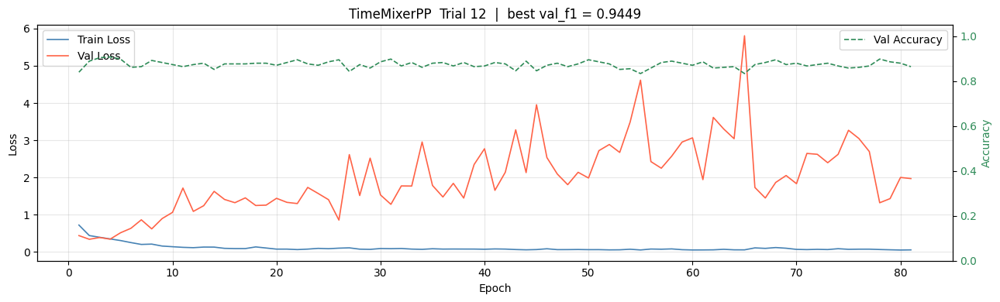

  [TimeMixerPP] trial 13 (COMPLETE ) val_f1=0.9505  best=0.9576  (done=14, pruned=0)


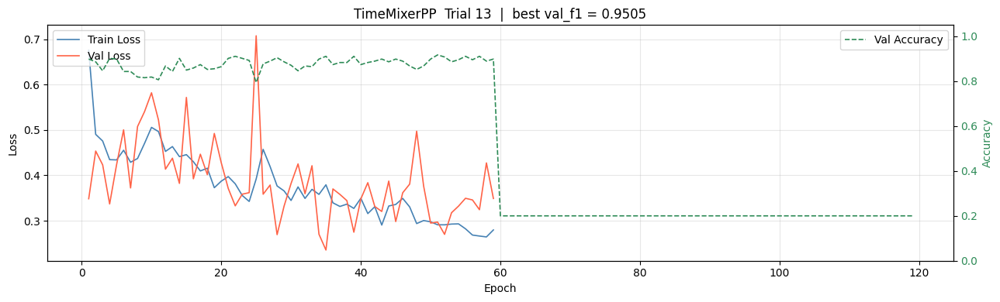

  [TimeMixerPP] trial 14 (COMPLETE ) val_f1=0.9572  best=0.9576  (done=15, pruned=0)


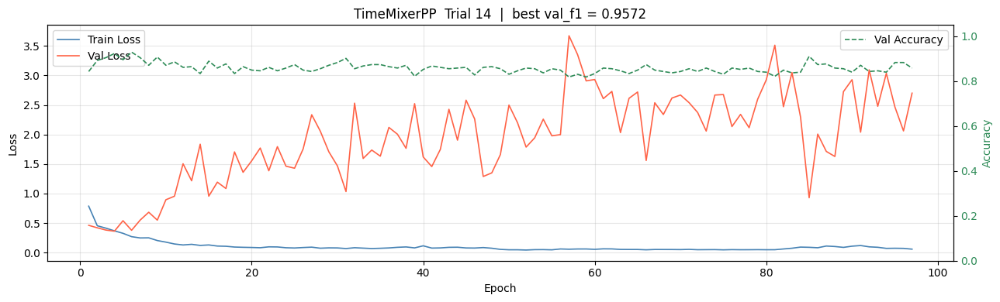

  Best: trial 11  val_f1=0.9576
  Params: {'lr': 0.0016202162213232946, 'wd': 0.0002453031885254973, 'dropout': 0.037648755911789566, 'bs': 128, 'd_model': 256, 'n_blocks': 4, 'k_periods': 4, 'n_heads': 2, 'patience': 75}
  E4 Overall F1: 0.9500

 Model: Medformer   study: stage1_Norm_Medformer
  Resuming from trial 0, running 15 more.
  [Medformer] trial  0 (COMPLETE ) val_f1=0.9529  best=0.9529  (done=1, pruned=0)


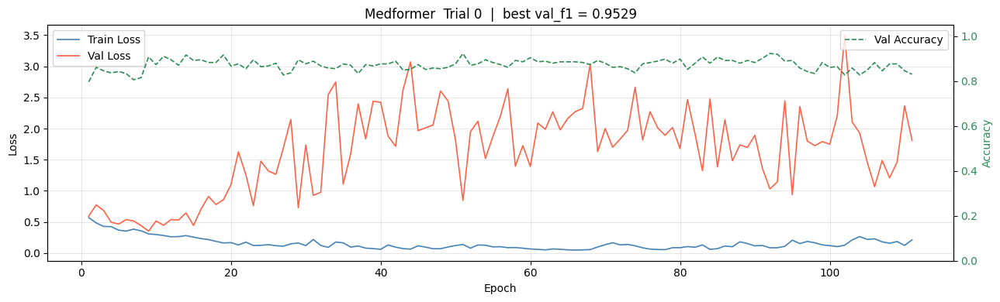

  [Medformer] trial  1 (COMPLETE ) val_f1=0.9478  best=0.9529  (done=2, pruned=0)


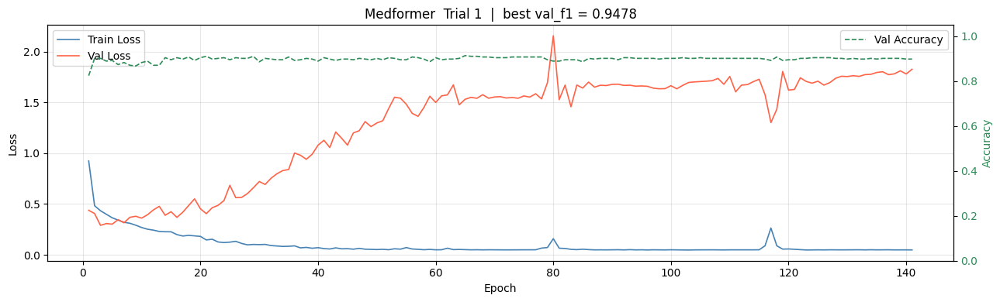

  [Medformer] trial  2 (COMPLETE ) val_f1=0.9449  best=0.9529  (done=3, pruned=0)


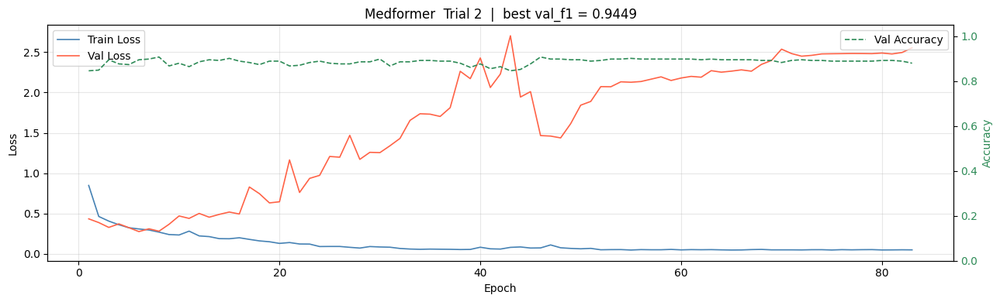

  [Medformer] trial  3 (COMPLETE ) val_f1=0.9557  best=0.9557  (done=4, pruned=0)


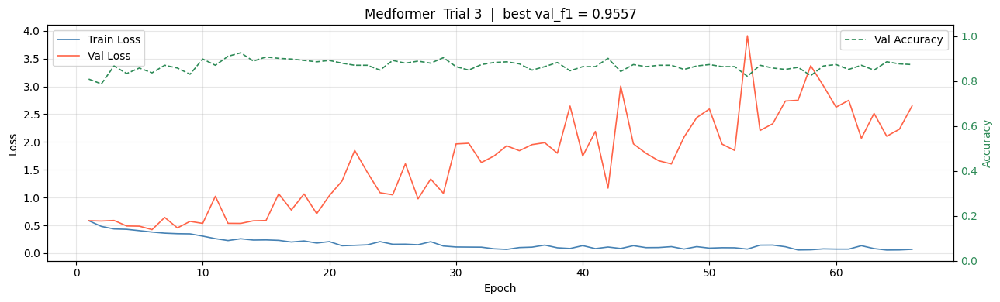

  [Medformer] trial  4 (COMPLETE ) val_f1=0.9625  best=0.9625  (done=5, pruned=0)


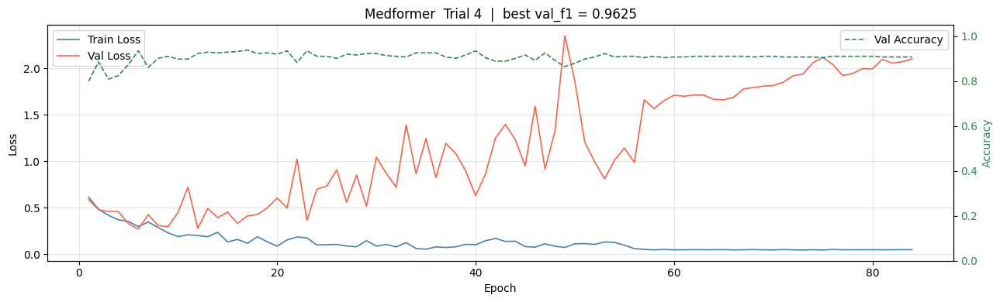

  [Medformer] trial  5 (COMPLETE ) val_f1=0.9450  best=0.9625  (done=6, pruned=0)


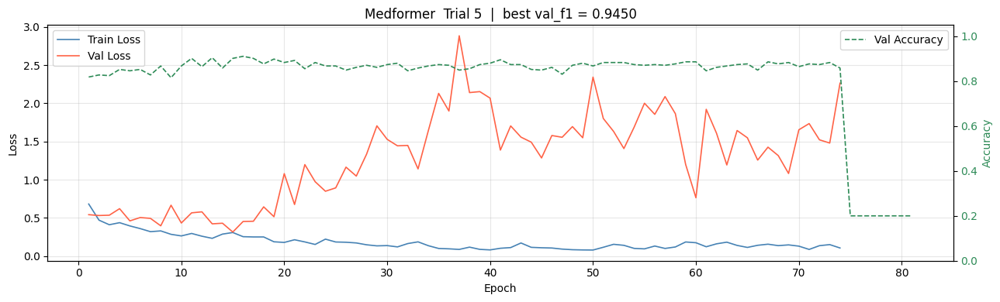

  [Medformer] trial  6 (COMPLETE ) val_f1=0.9585  best=0.9625  (done=7, pruned=0)


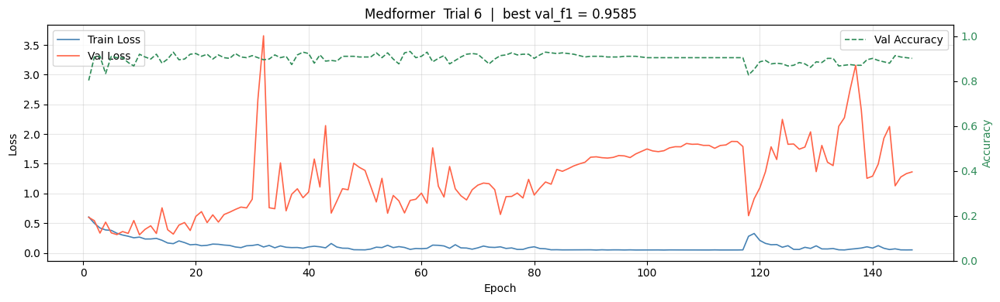

  [Medformer] trial  7 (COMPLETE ) val_f1=0.9062  best=0.9625  (done=8, pruned=0)


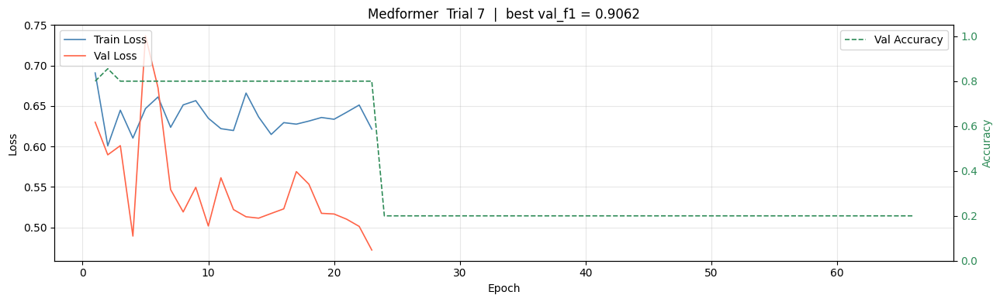

  [Medformer] trial  8 (COMPLETE ) val_f1=0.9431  best=0.9625  (done=9, pruned=0)


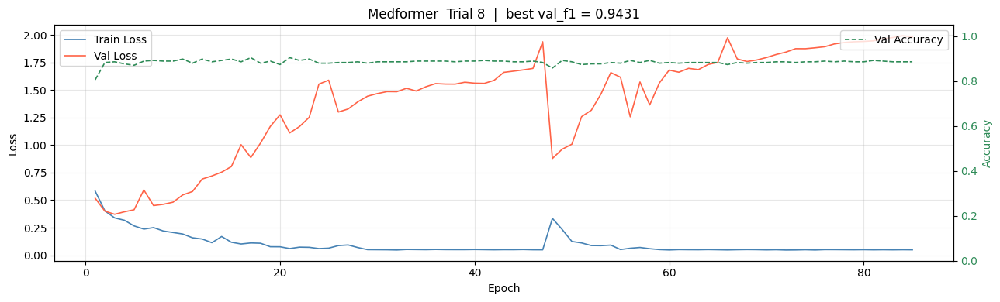

  [Medformer] trial  9 (COMPLETE ) val_f1=0.8889  best=0.9625  (done=10, pruned=0)


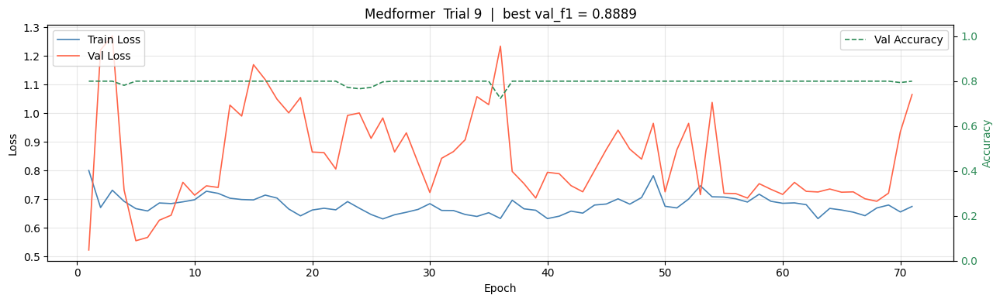

  [Medformer] trial 10 (COMPLETE ) val_f1=0.9472  best=0.9625  (done=11, pruned=0)


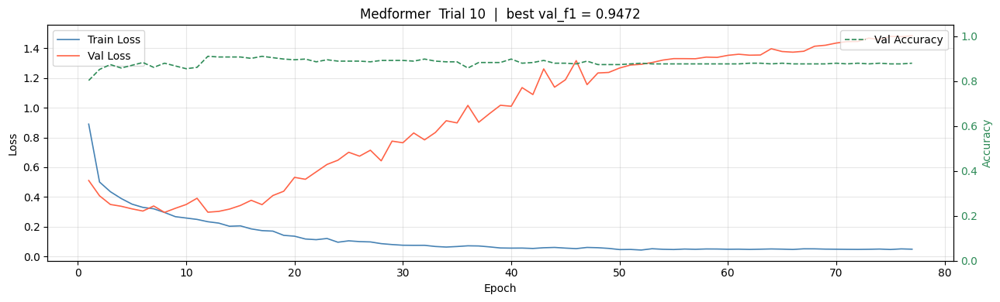

  [Medformer] trial 11 (COMPLETE ) val_f1=0.9535  best=0.9625  (done=12, pruned=0)


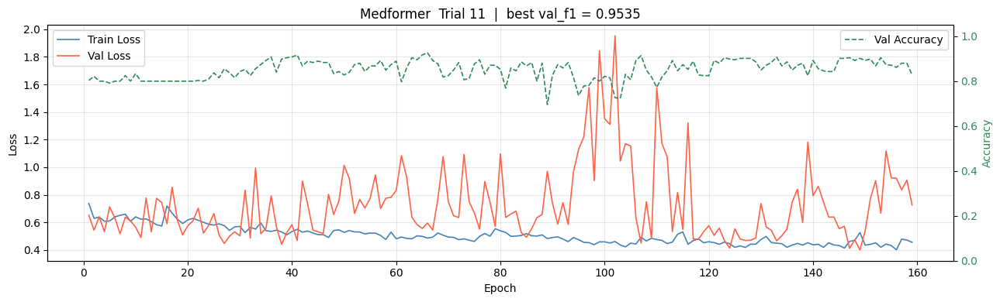

  [Medformer] trial 12 (COMPLETE ) val_f1=0.9490  best=0.9625  (done=13, pruned=0)


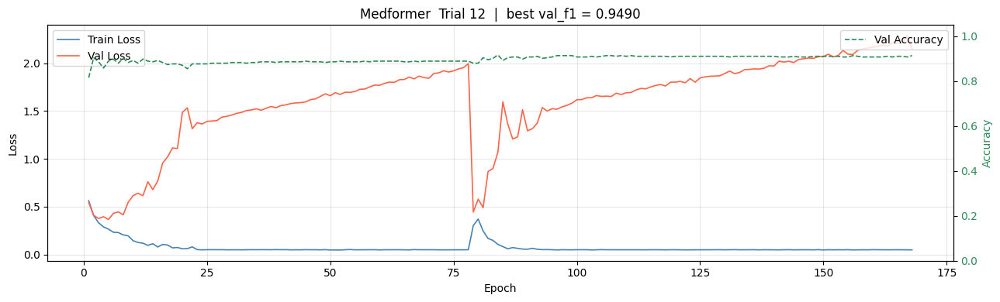

  [Medformer] trial 13 (COMPLETE ) val_f1=0.9520  best=0.9625  (done=14, pruned=0)


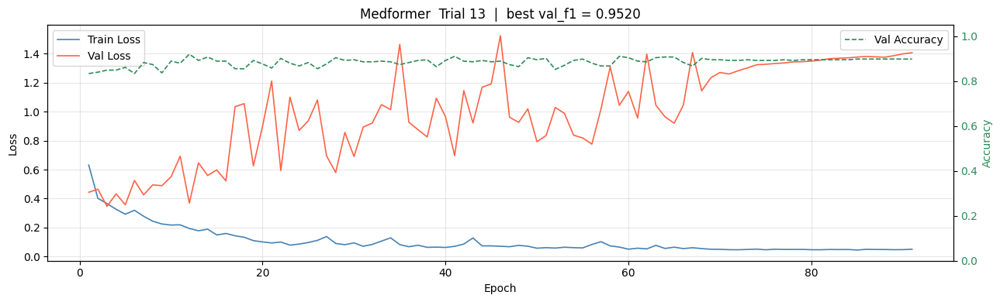

  [Medformer] trial 14 (COMPLETE ) val_f1=0.9517  best=0.9625  (done=15, pruned=0)


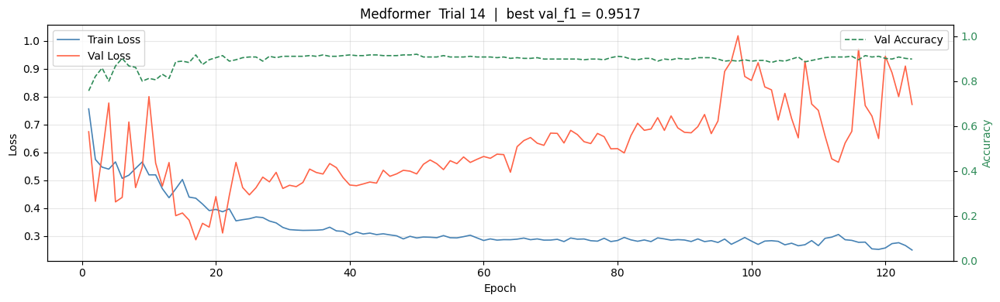

  Best: trial 4  val_f1=0.9625
  Params: {'lr': 0.0018199961682604955, 'wd': 0.0009978565648095879, 'dropout': 0.26175060910830134, 'bs': 32, 'd_model': 128, 'n_heads': 4, 'n_layers': 1, 'patience': 67}
  E4 Overall F1: 0.9437

 Model: TSLANet   study: stage1_Norm_TSLANet
  Resuming from trial 0, running 15 more.
  [TSLANet] trial  0 (COMPLETE ) val_f1=0.9511  best=0.9511  (done=1, pruned=0)


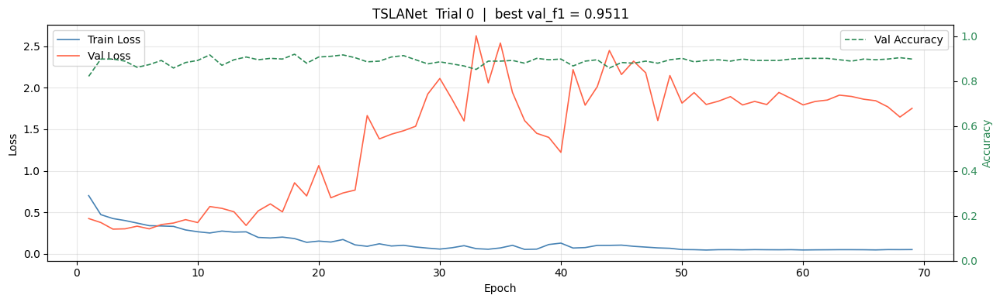

  [TSLANet] trial  1 (COMPLETE ) val_f1=0.9489  best=0.9511  (done=2, pruned=0)


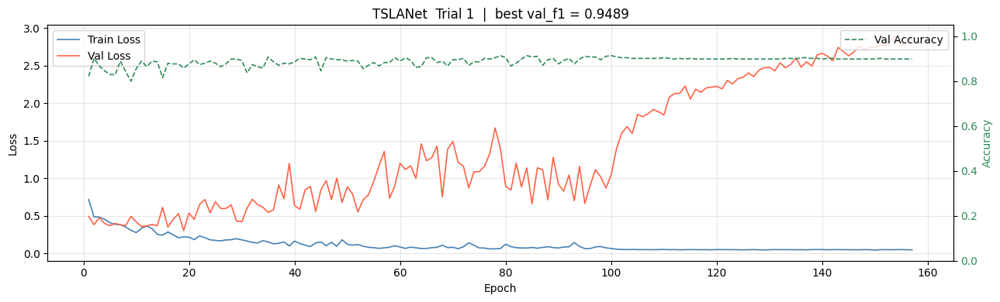

  [TSLANet] trial  2 (COMPLETE ) val_f1=0.9524  best=0.9524  (done=3, pruned=0)


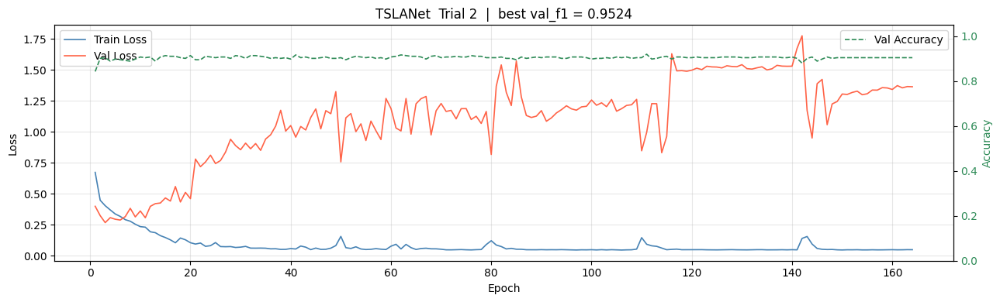

  [TSLANet] trial  3 (COMPLETE ) val_f1=0.9519  best=0.9524  (done=4, pruned=0)


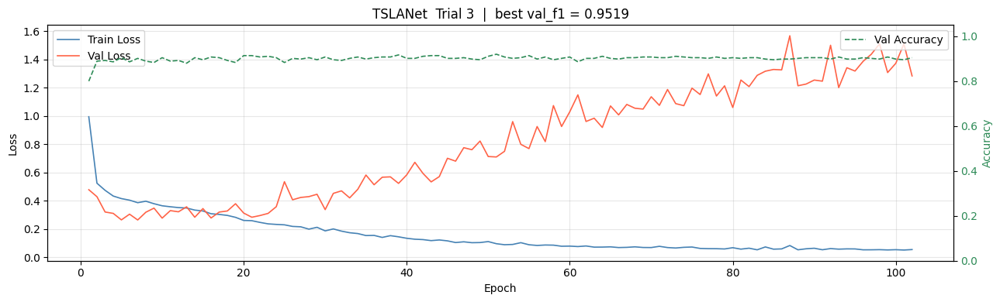

  [TSLANet] trial  4 (COMPLETE ) val_f1=0.9534  best=0.9534  (done=5, pruned=0)


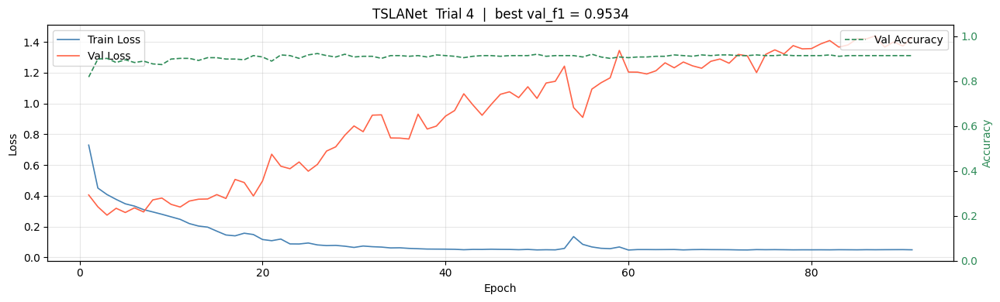

  [TSLANet] trial  5 (COMPLETE ) val_f1=0.9541  best=0.9541  (done=6, pruned=0)


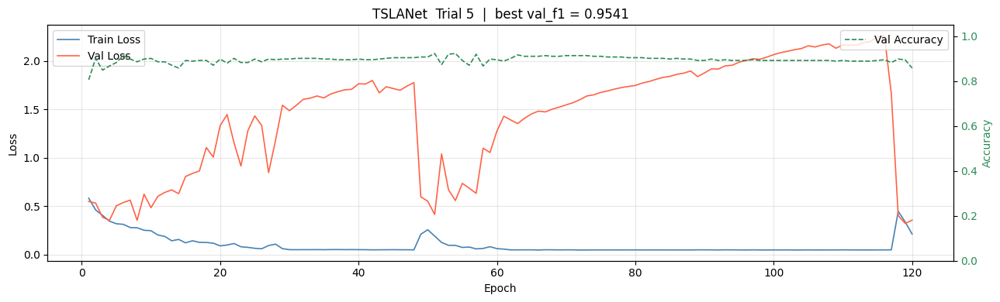

  [TSLANet] trial  6 (COMPLETE ) val_f1=0.9520  best=0.9541  (done=7, pruned=0)


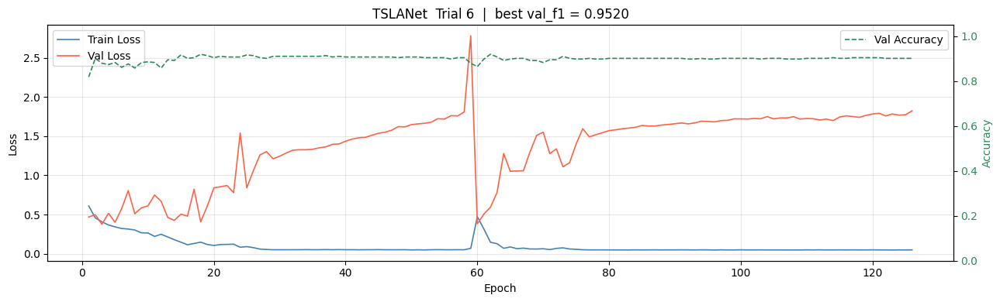

  [TSLANet] trial  7 (COMPLETE ) val_f1=0.9540  best=0.9541  (done=8, pruned=0)


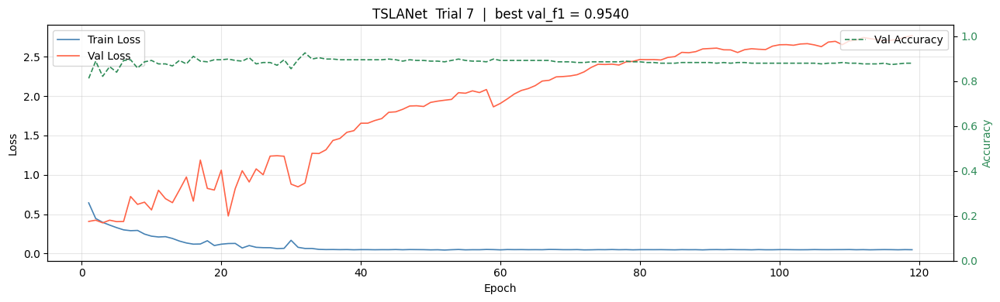

  [TSLANet] trial  8 (COMPLETE ) val_f1=0.9437  best=0.9541  (done=9, pruned=0)


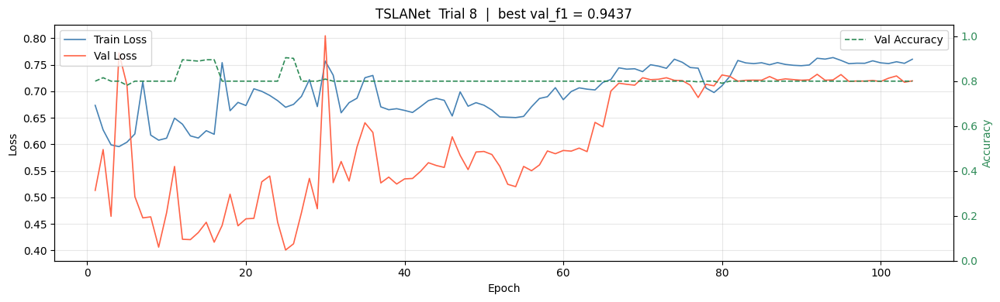

  [TSLANet] trial  9 (COMPLETE ) val_f1=0.9478  best=0.9541  (done=10, pruned=0)


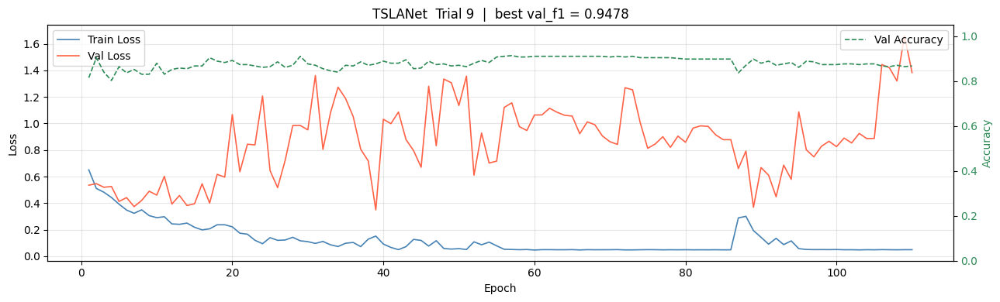

  [TSLANet] trial 10 (COMPLETE ) val_f1=0.9519  best=0.9541  (done=11, pruned=0)


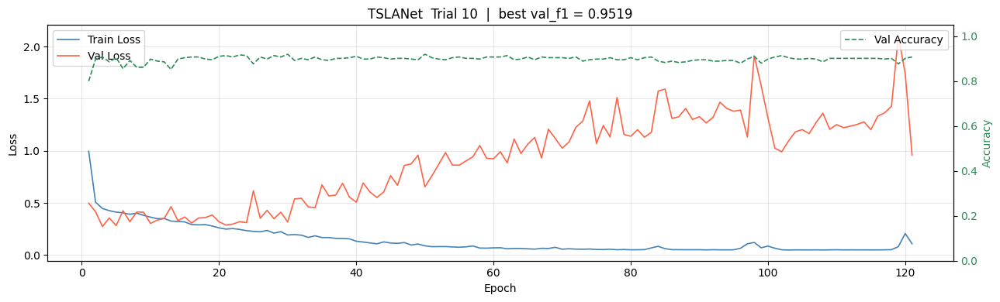

  [TSLANet] trial 11 (COMPLETE ) val_f1=0.9575  best=0.9575  (done=12, pruned=0)


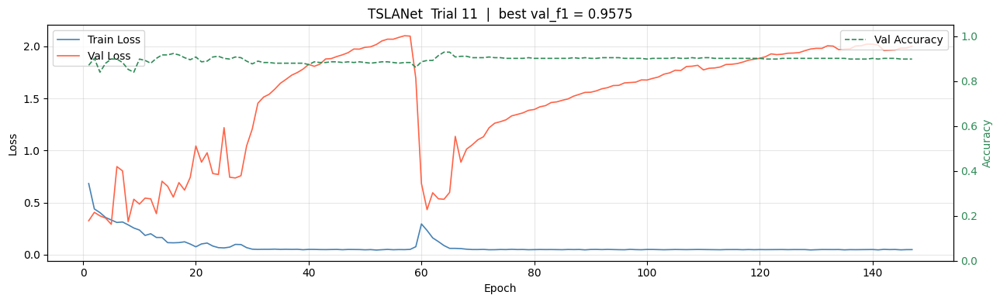

  [TSLANet] trial 12 (COMPLETE ) val_f1=0.9489  best=0.9575  (done=13, pruned=0)


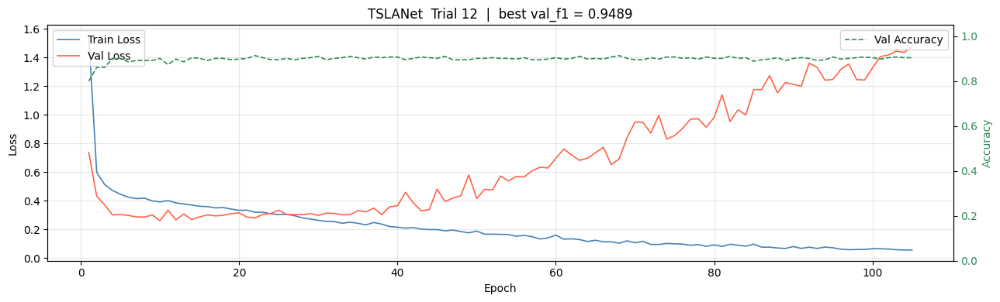

  [TSLANet] trial 13 (COMPLETE ) val_f1=0.9453  best=0.9575  (done=14, pruned=0)


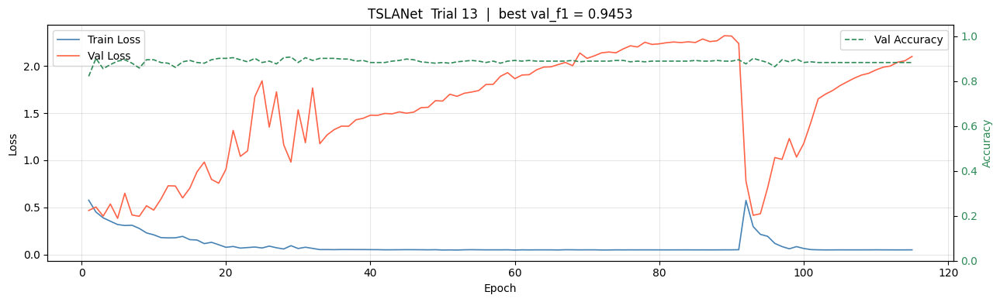

  [TSLANet] trial 14 (COMPLETE ) val_f1=0.9541  best=0.9575  (done=15, pruned=0)


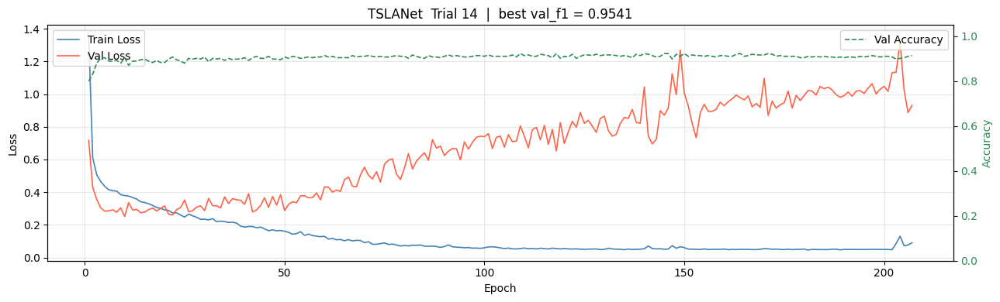

  Best: trial 11  val_f1=0.9575
  Params: {'lr': 0.0009239759539528132, 'wd': 1.404776898323358e-05, 'dropout': 0.10633091672223487, 'bs': 64, 'd_model': 256, 'n_blocks': 2, 'patience': 83}
  E4 Overall F1: 0.8972

 Model: ModernTCN   study: stage1_Norm_ModernTCN
  Resuming from trial 0, running 15 more.
  [ModernTCN] trial  0 (COMPLETE ) val_f1=0.9541  best=0.9541  (done=1, pruned=0)


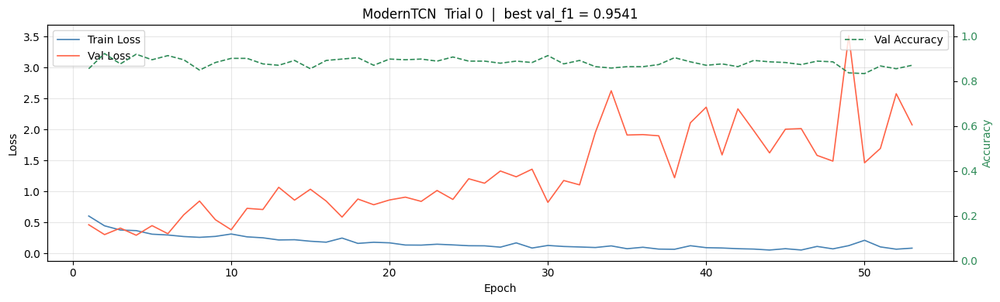

  [ModernTCN] trial  1 (COMPLETE ) val_f1=0.9559  best=0.9559  (done=2, pruned=0)


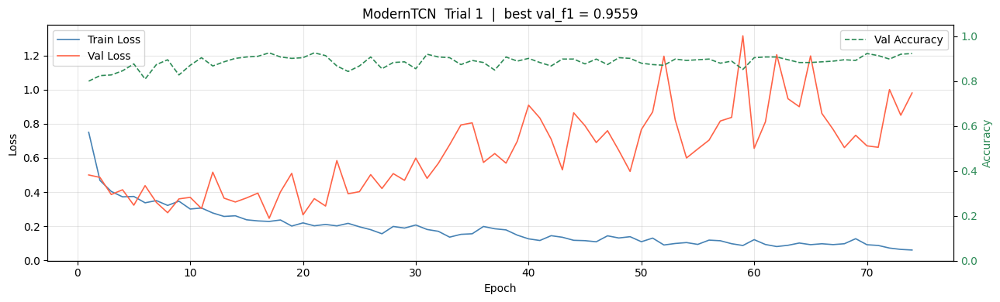

  [ModernTCN] trial  2 (COMPLETE ) val_f1=0.9630  best=0.9630  (done=3, pruned=0)


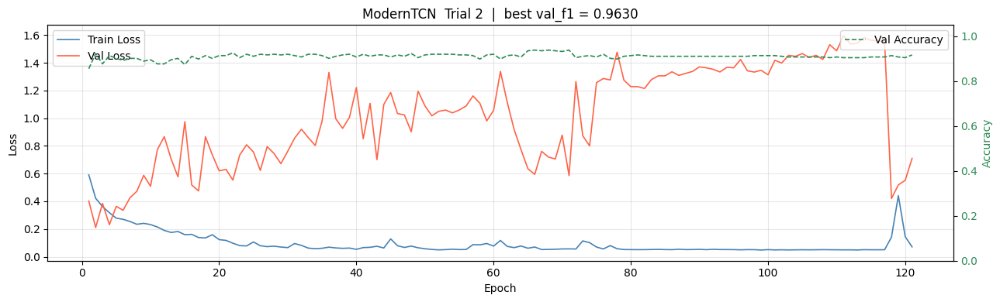

  [ModernTCN] trial  3 (COMPLETE ) val_f1=0.9472  best=0.9630  (done=4, pruned=0)


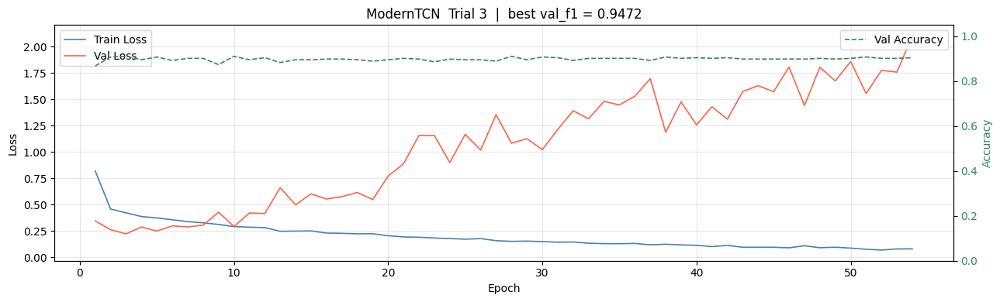

  [ModernTCN] trial  4 (COMPLETE ) val_f1=0.9623  best=0.9630  (done=5, pruned=0)


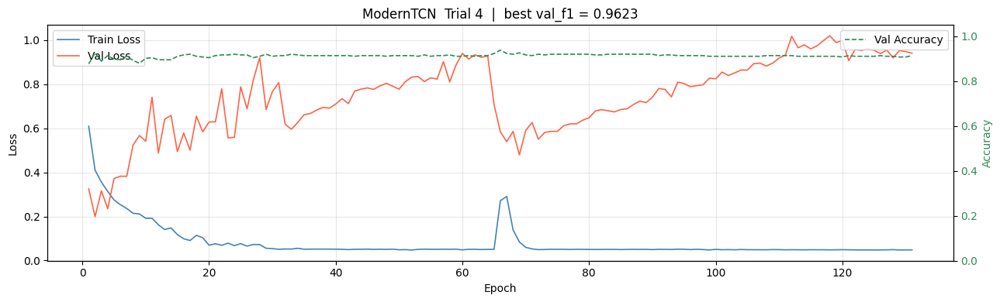

  [ModernTCN] trial  5 (COMPLETE ) val_f1=0.9565  best=0.9630  (done=6, pruned=0)


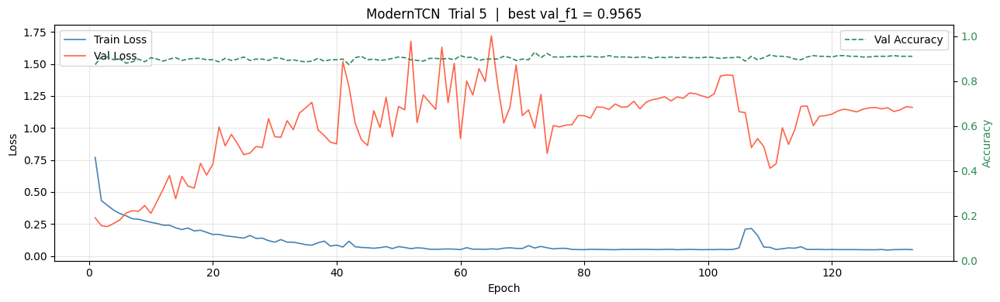

  [ModernTCN] trial  6 (COMPLETE ) val_f1=0.9557  best=0.9630  (done=7, pruned=0)


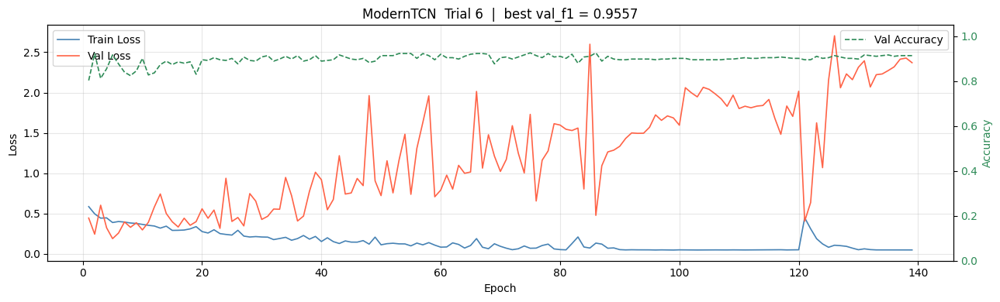

  [ModernTCN] trial  7 (COMPLETE ) val_f1=0.9536  best=0.9630  (done=8, pruned=0)


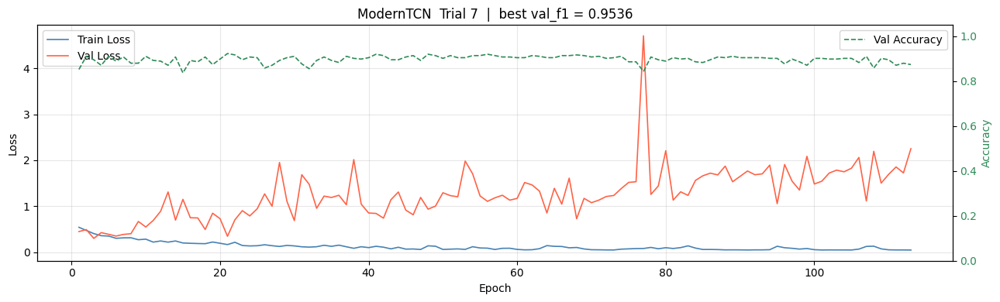

  [ModernTCN] trial  8 (COMPLETE ) val_f1=0.9495  best=0.9630  (done=9, pruned=0)


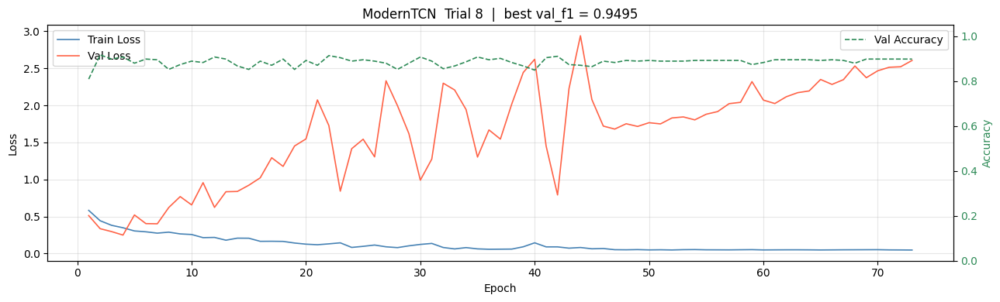

  [ModernTCN] trial  9 (COMPLETE ) val_f1=0.9540  best=0.9630  (done=10, pruned=0)


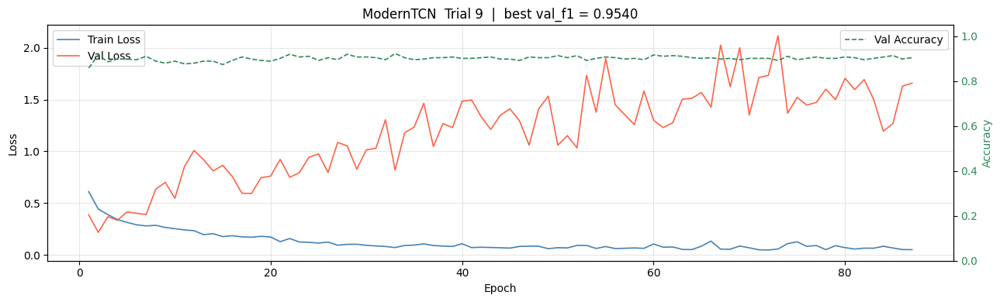

  [ModernTCN] trial 10 (COMPLETE ) val_f1=0.9644  best=0.9644  (done=11, pruned=0)


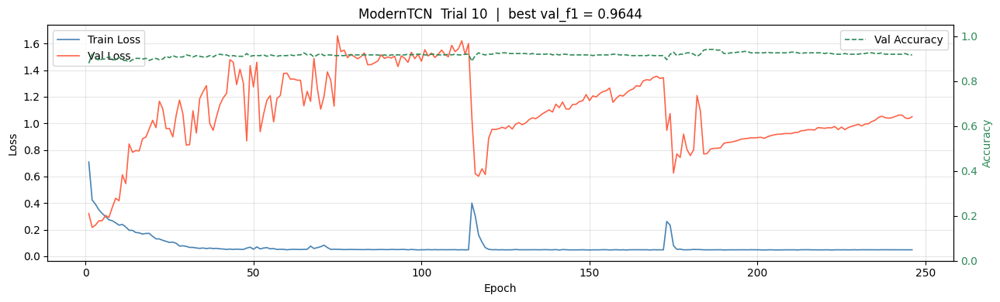

  [ModernTCN] trial 11 (COMPLETE ) val_f1=0.9606  best=0.9644  (done=12, pruned=0)


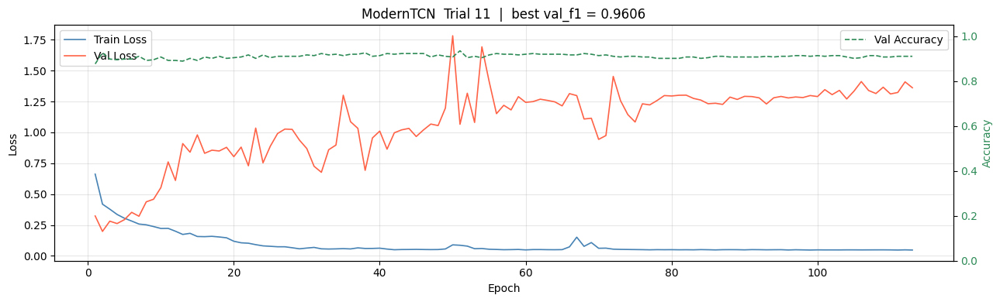

  [ModernTCN] trial 12 (COMPLETE ) val_f1=0.9576  best=0.9644  (done=13, pruned=0)


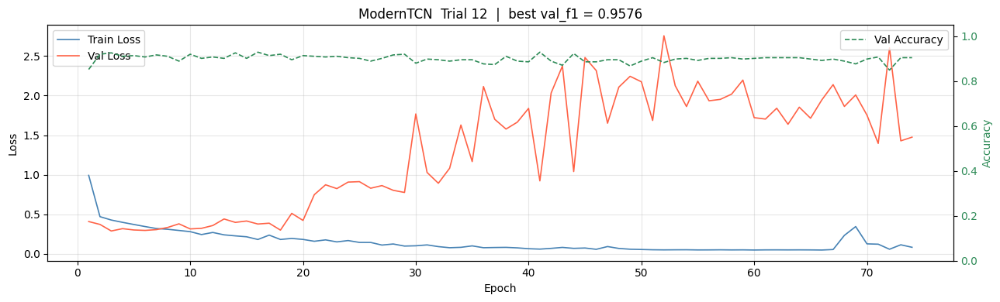

  [ModernTCN] trial 13 (COMPLETE ) val_f1=0.9576  best=0.9644  (done=14, pruned=0)


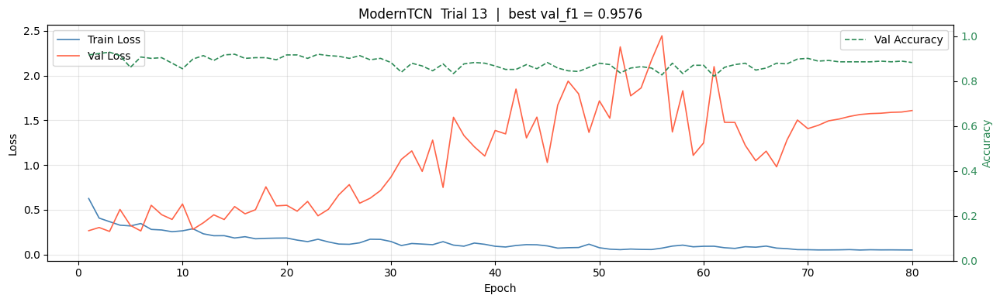

  [ModernTCN] trial 14 (COMPLETE ) val_f1=0.9486  best=0.9644  (done=15, pruned=0)


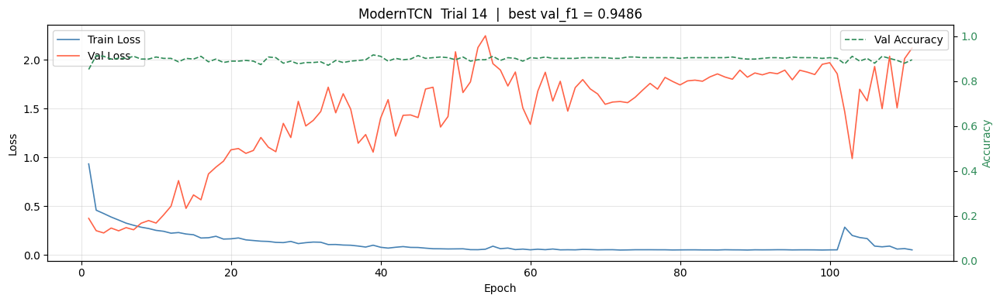

  Best: trial 10  val_f1=0.9644
  Params: {'lr': 0.00014631420737218462, 'wd': 1.1677536416705781e-05, 'dropout': 0.06586857772445559, 'bs': 32, 'd_model': 256, 'n_blocks': 1, 'patience': 61}
  E4 Overall F1: 0.8767

 Model: CrossGNN   study: stage1_Norm_CrossGNN
  Resuming from trial 0, running 15 more.
  [CrossGNN] trial  0 (COMPLETE ) val_f1=0.9625  best=0.9625  (done=1, pruned=0)


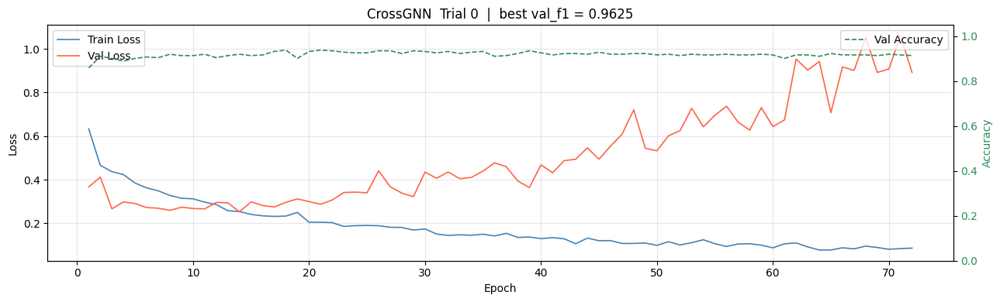

  [CrossGNN] trial  1 (COMPLETE ) val_f1=0.9682  best=0.9682  (done=2, pruned=0)


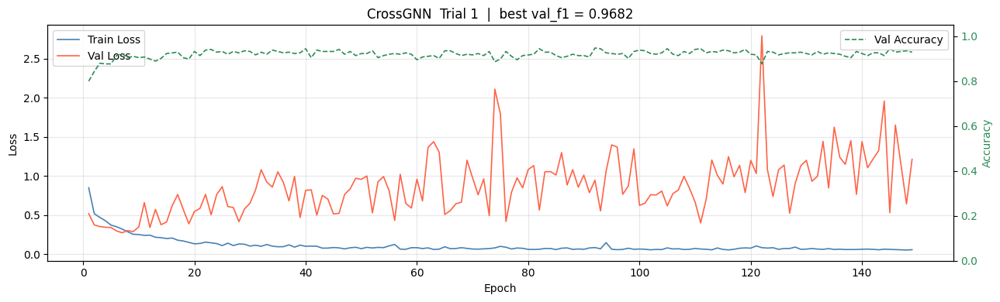

  [CrossGNN] trial  2 (COMPLETE ) val_f1=0.9541  best=0.9682  (done=3, pruned=0)


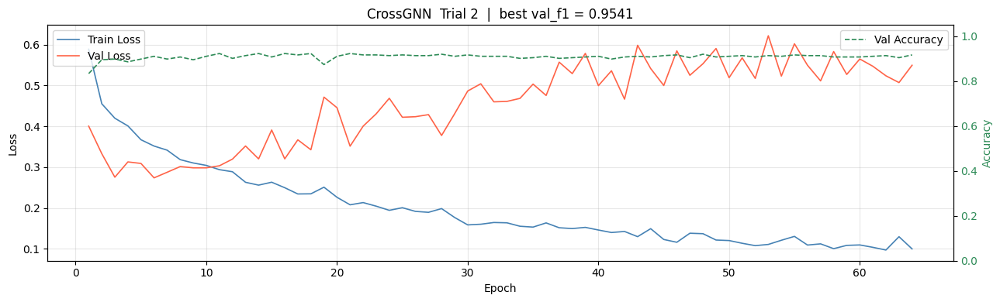

  [CrossGNN] trial  3 (COMPLETE ) val_f1=0.9593  best=0.9682  (done=4, pruned=0)


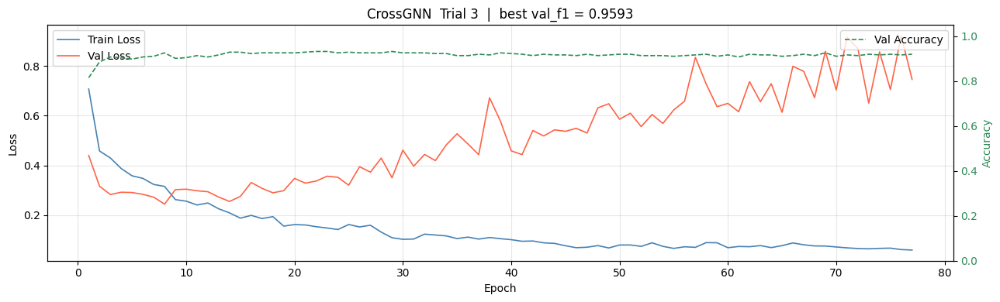

  [CrossGNN] trial  4 (COMPLETE ) val_f1=0.9682  best=0.9682  (done=5, pruned=0)


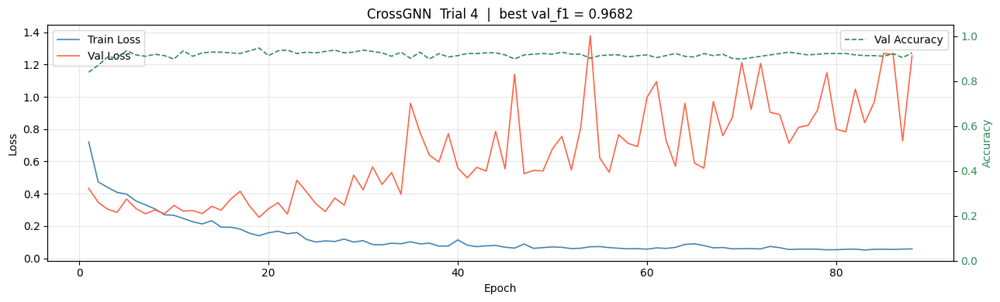

  [CrossGNN] trial  5 (COMPLETE ) val_f1=0.9594  best=0.9682  (done=6, pruned=0)


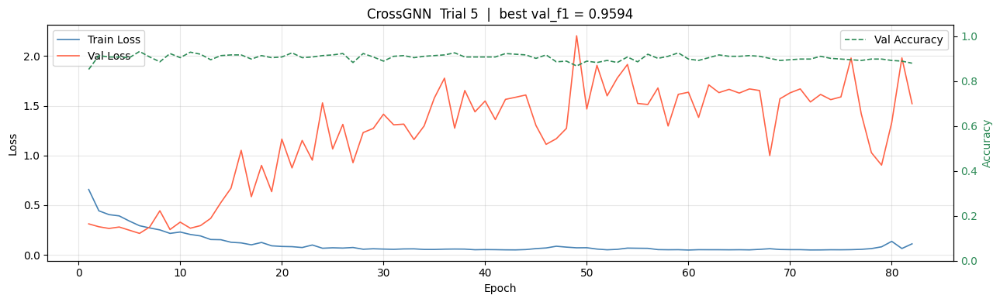

  [CrossGNN] trial  6 (COMPLETE ) val_f1=0.9756  best=0.9756  (done=7, pruned=0)


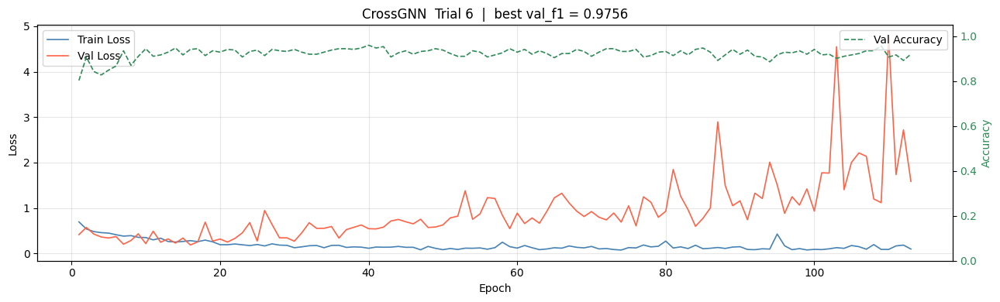

  [CrossGNN] trial  7 (COMPLETE ) val_f1=0.9630  best=0.9756  (done=8, pruned=0)


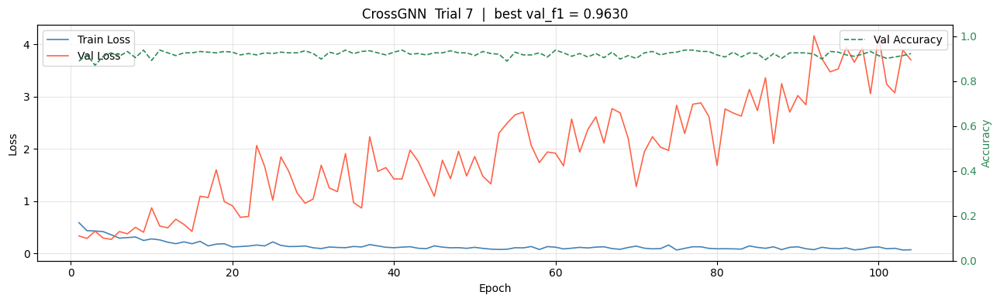

  [CrossGNN] trial  8 (COMPLETE ) val_f1=0.9647  best=0.9756  (done=9, pruned=0)


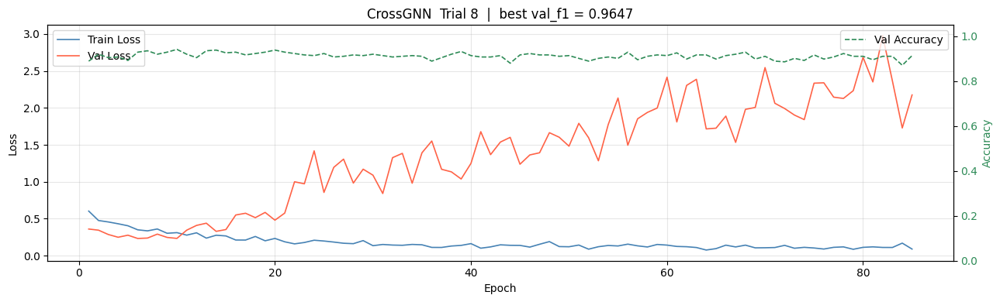

  [CrossGNN] trial  9 (COMPLETE ) val_f1=0.9606  best=0.9756  (done=10, pruned=0)


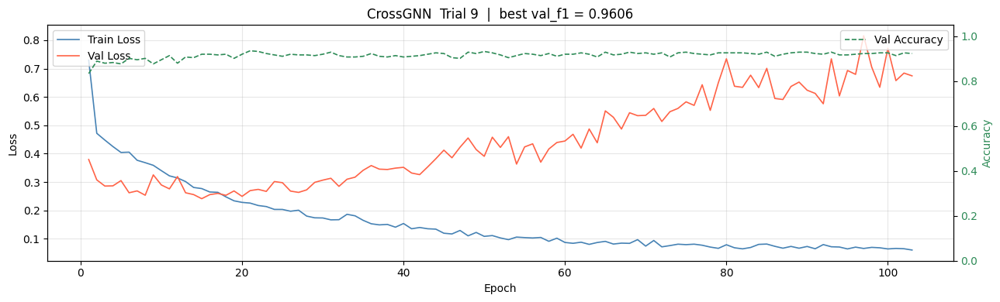

  [CrossGNN] trial 10 (COMPLETE ) val_f1=0.9720  best=0.9756  (done=11, pruned=0)


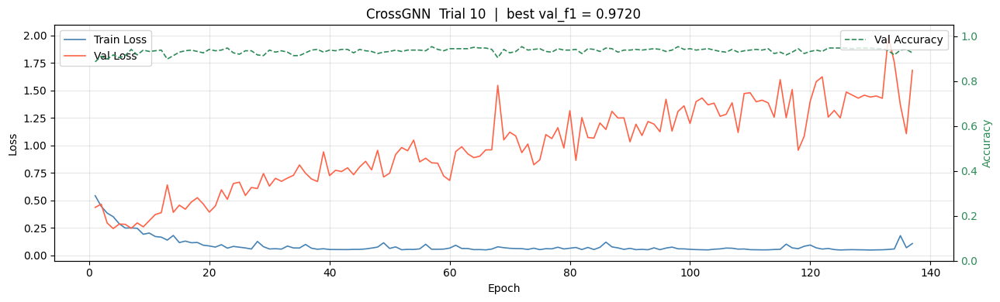

  [CrossGNN] trial 11 (COMPLETE ) val_f1=0.9646  best=0.9756  (done=12, pruned=0)


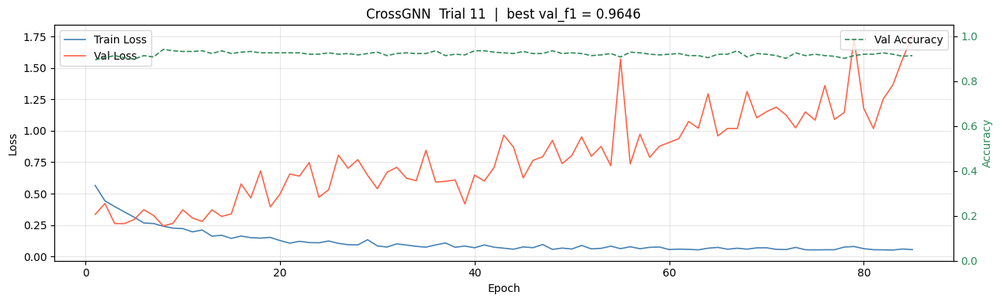

  [CrossGNN] trial 12 (COMPLETE ) val_f1=0.9738  best=0.9756  (done=13, pruned=0)


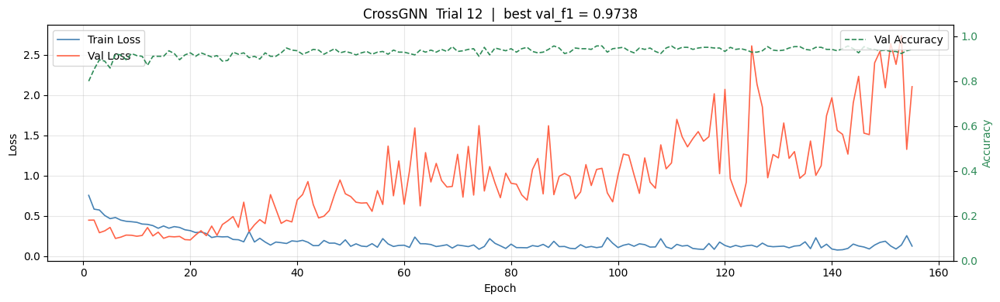

  [CrossGNN] trial 13 (COMPLETE ) val_f1=0.9738  best=0.9756  (done=14, pruned=0)


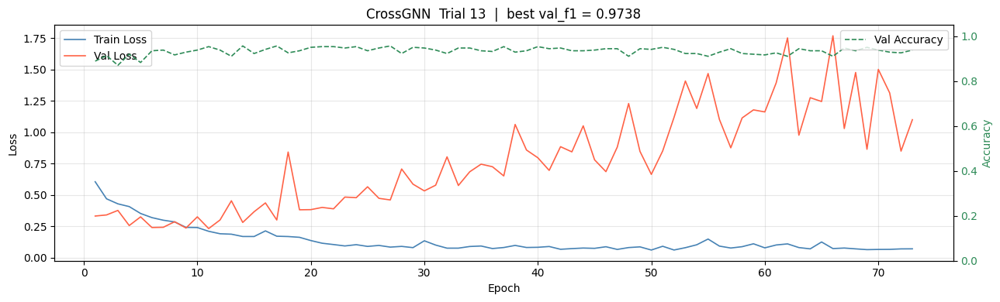

  [CrossGNN] trial 14 (COMPLETE ) val_f1=0.9719  best=0.9756  (done=15, pruned=0)


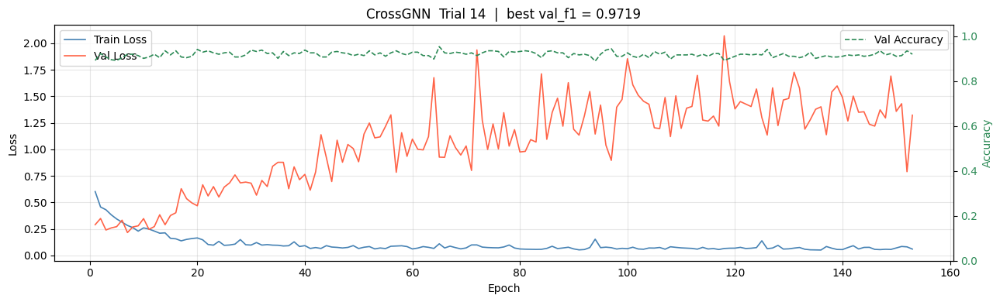

  Best: trial 6  val_f1=0.9756
  Params: {'lr': 0.00964321820344378, 'wd': 0.001548032798946949, 'dropout': 0.13758926013138395, 'bs': 32, 'd_model': 64, 'n_layers': 3, 'patience': 73}
  E4 Overall F1: 0.9439

 Model: TimesNet   study: stage1_Norm_TimesNet
  Resuming from trial 0, running 15 more.
  [TimesNet] trial  0 (COMPLETE ) val_f1=0.9630  best=0.9630  (done=1, pruned=0)


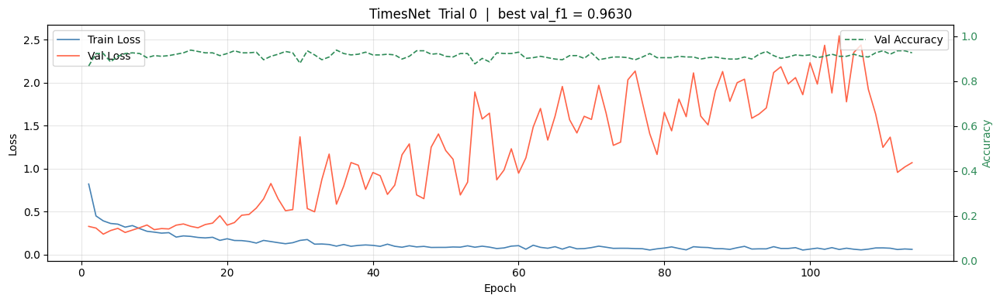

  [TimesNet] trial  1 (COMPLETE ) val_f1=0.9609  best=0.9630  (done=2, pruned=0)


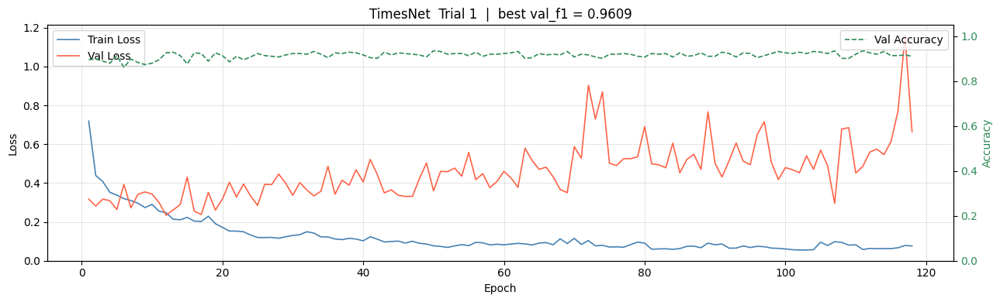

  [TimesNet] trial  2 (COMPLETE ) val_f1=0.9664  best=0.9664  (done=3, pruned=0)


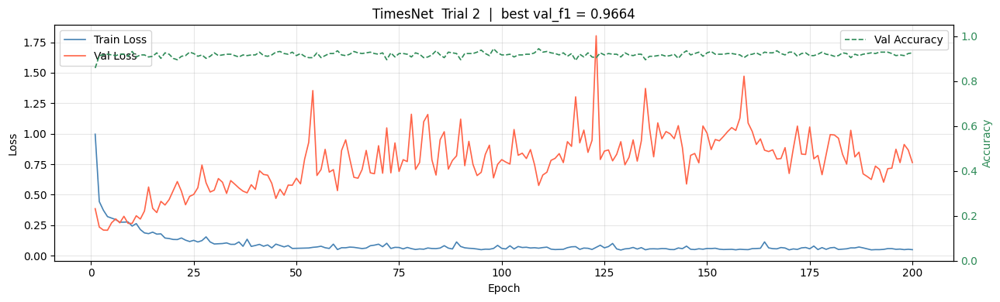

  [TimesNet] trial  3 (COMPLETE ) val_f1=0.9662  best=0.9664  (done=4, pruned=0)


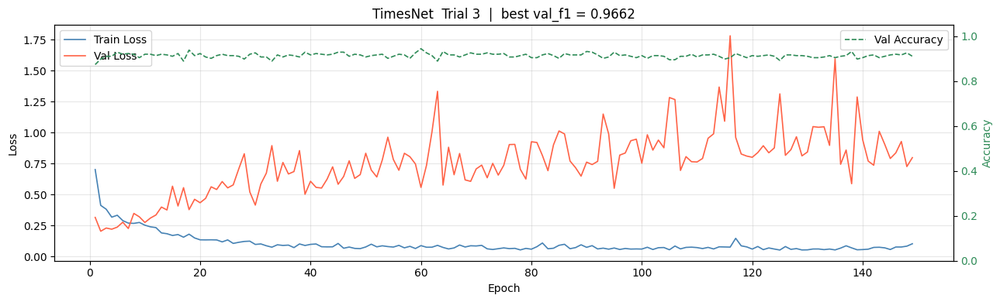

  [TimesNet] trial  4 (COMPLETE ) val_f1=0.9647  best=0.9664  (done=5, pruned=0)


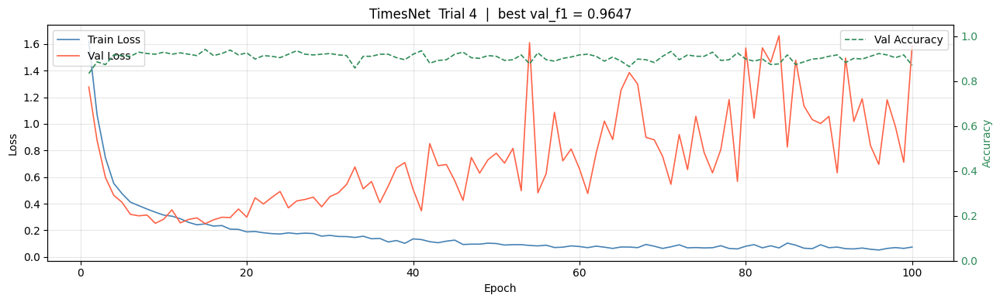

  [TimesNet] trial  5 (COMPLETE ) val_f1=0.9567  best=0.9664  (done=6, pruned=0)


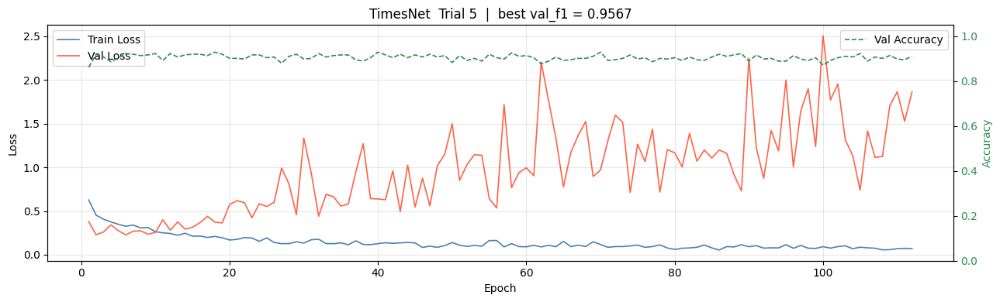

  [TimesNet] trial  6 (COMPLETE ) val_f1=0.9683  best=0.9683  (done=7, pruned=0)


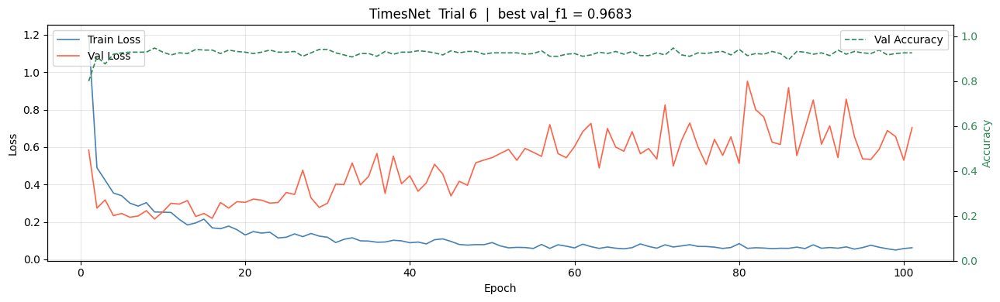

  [TimesNet] trial  7 (COMPLETE ) val_f1=0.9647  best=0.9683  (done=8, pruned=0)


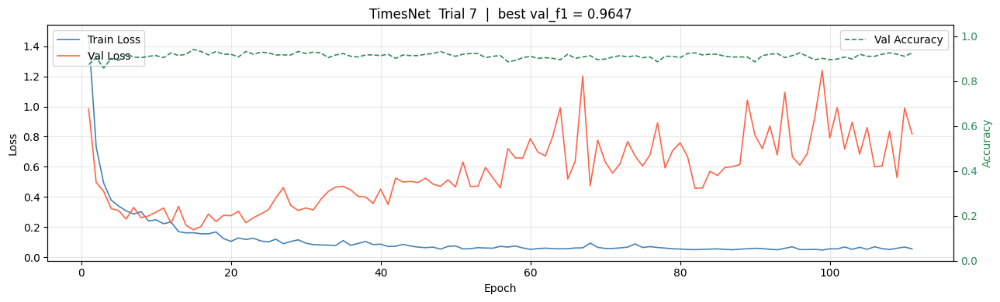

  [TimesNet] trial  8 (COMPLETE ) val_f1=0.9683  best=0.9683  (done=9, pruned=0)


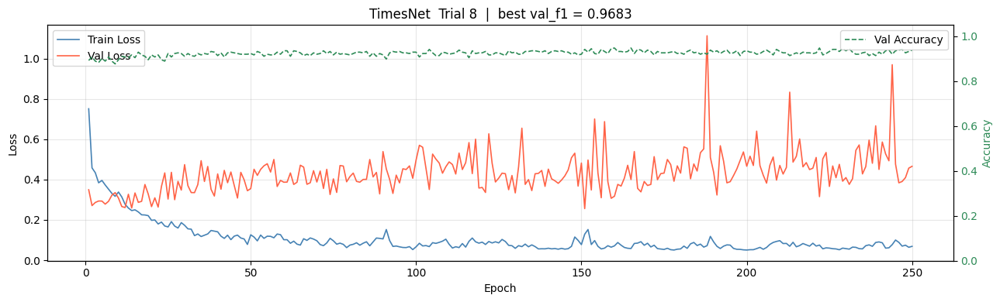

  [TimesNet] trial  9 (COMPLETE ) val_f1=0.9628  best=0.9683  (done=10, pruned=0)


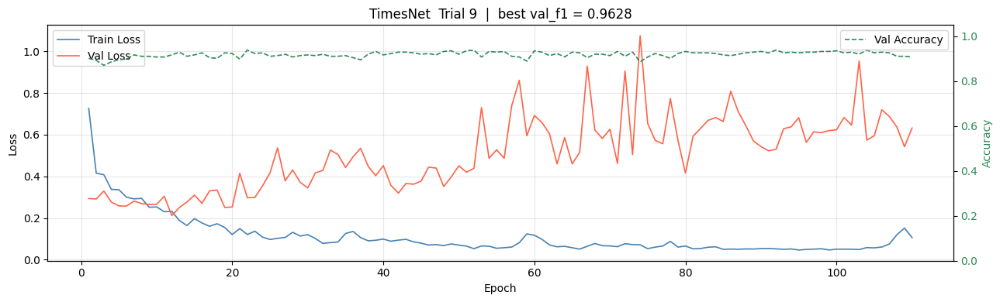

  [TimesNet] trial 10 (COMPLETE ) val_f1=0.9645  best=0.9683  (done=11, pruned=0)


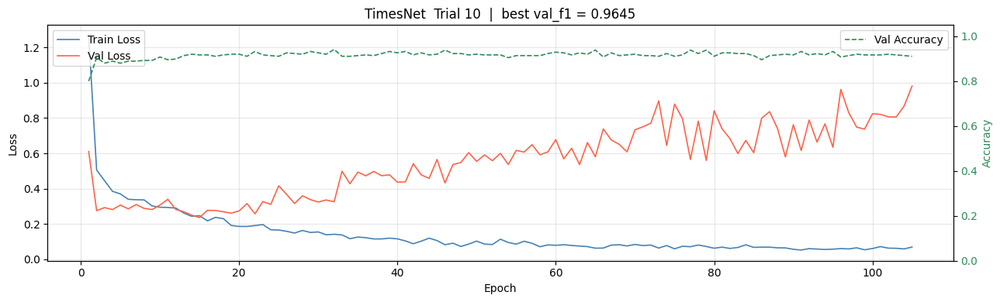

  [TimesNet] trial 11 (COMPLETE ) val_f1=0.9665  best=0.9683  (done=12, pruned=0)


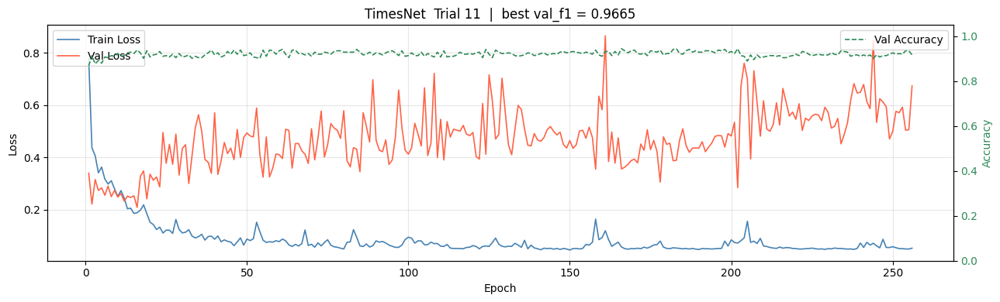

  [TimesNet] trial 12 (COMPLETE ) val_f1=0.9720  best=0.9720  (done=13, pruned=0)


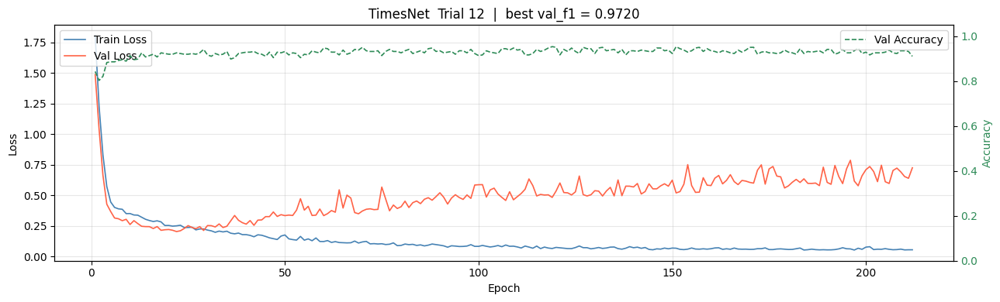

  [TimesNet] trial 13 (COMPLETE ) val_f1=0.9683  best=0.9720  (done=14, pruned=0)


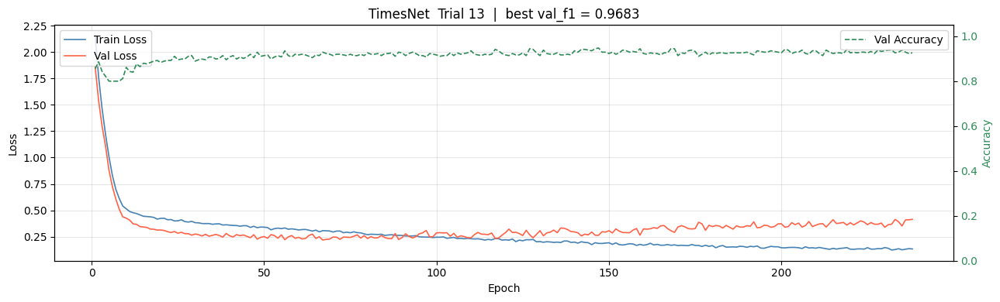

  [TimesNet] trial 14 (COMPLETE ) val_f1=0.9660  best=0.9720  (done=15, pruned=0)


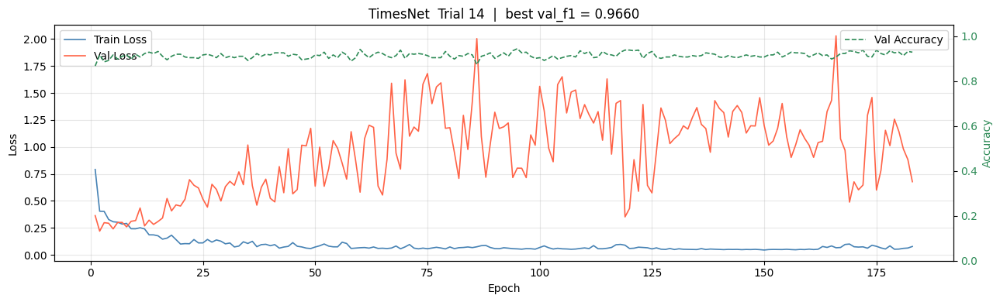

  Best: trial 12  val_f1=0.9720
  Params: {'lr': 0.0004033388431032321, 'wd': 0.00019989790022103038, 'dropout': 0.10525561845839082, 'bs': 128, 'd_model': 32, 'n_blocks': 2, 'k_periods': 5, 'patience': 93}
  E4 Overall F1: 0.9014

 Model: Mamba2   study: stage1_Norm_Mamba2
  Resuming from trial 0, running 15 more.
  [Mamba2] trial  0 (COMPLETE ) val_f1=0.9683  best=0.9683  (done=1, pruned=0)


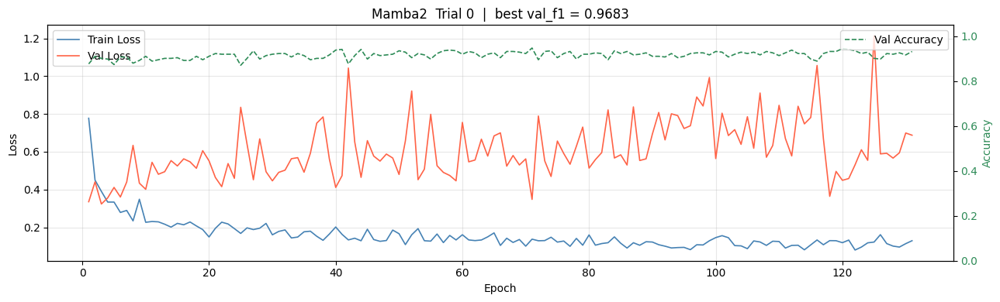

  [Mamba2] trial  1 (COMPLETE ) val_f1=0.9630  best=0.9683  (done=2, pruned=0)


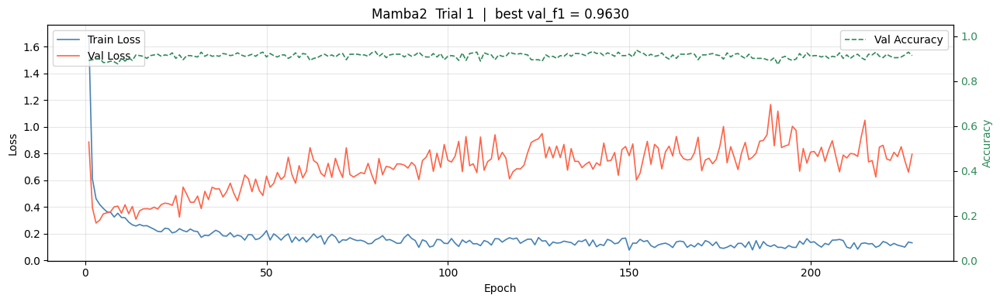

  [Mamba2] trial  2 (COMPLETE ) val_f1=0.9701  best=0.9701  (done=3, pruned=0)


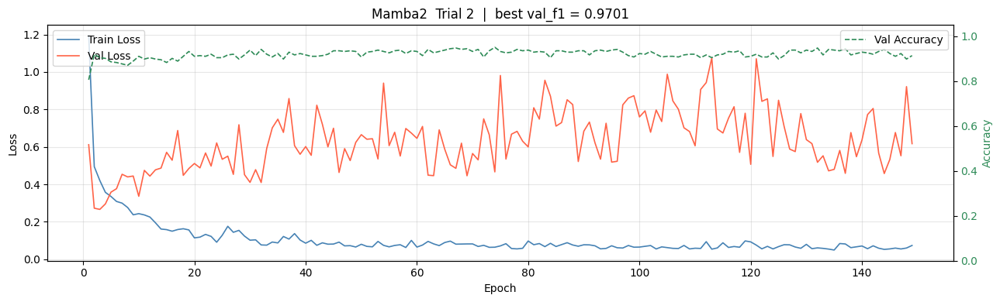

  [Mamba2] trial  3 (COMPLETE ) val_f1=0.9630  best=0.9701  (done=4, pruned=0)


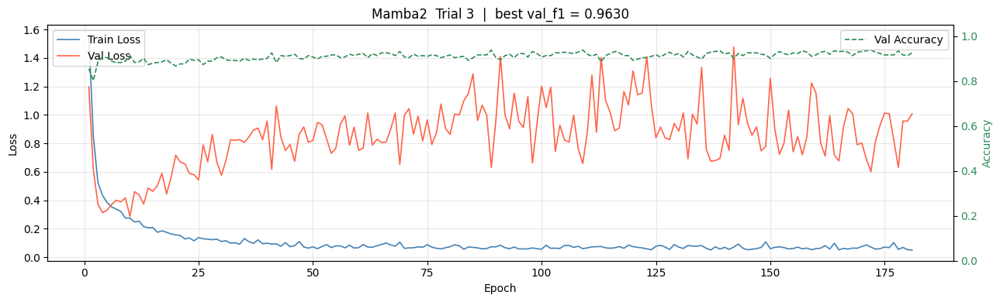

  [Mamba2] trial  4 (COMPLETE ) val_f1=0.9665  best=0.9701  (done=5, pruned=0)


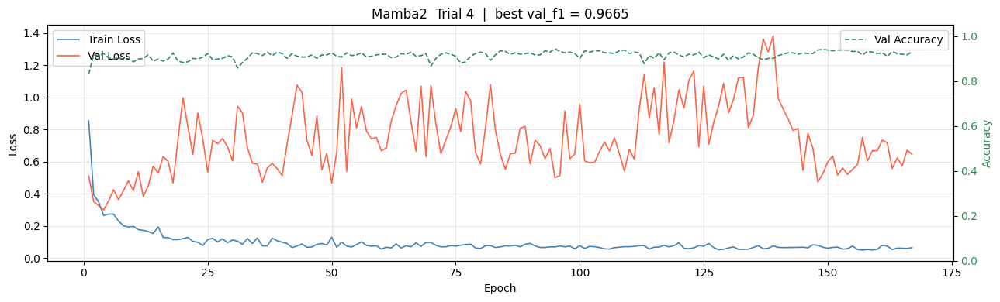

  [Mamba2] trial  5 (COMPLETE ) val_f1=0.9610  best=0.9701  (done=6, pruned=0)


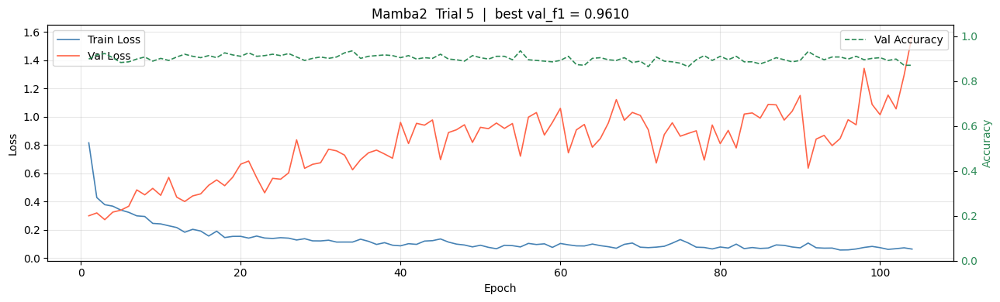

  [Mamba2] trial  6 (COMPLETE ) val_f1=0.9524  best=0.9701  (done=7, pruned=0)


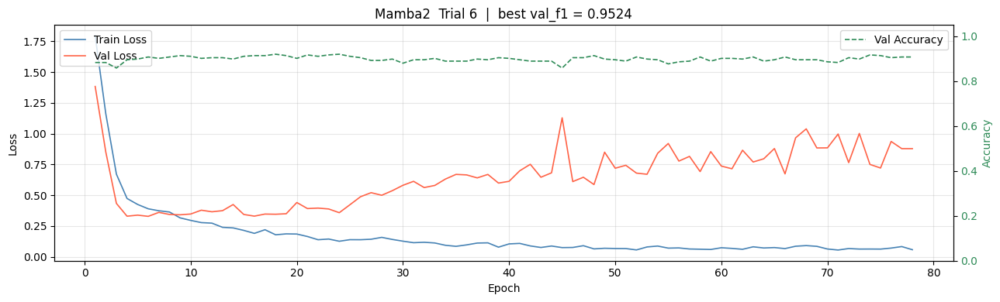

  [Mamba2] trial  7 (COMPLETE ) val_f1=0.9664  best=0.9701  (done=8, pruned=0)


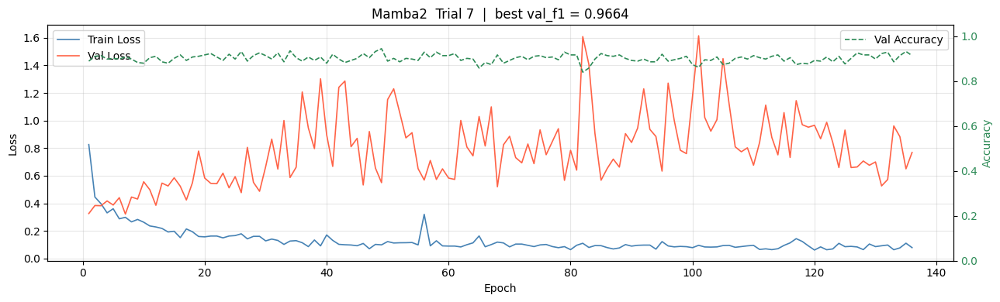

  [Mamba2] trial  8 (COMPLETE ) val_f1=0.9701  best=0.9701  (done=9, pruned=0)


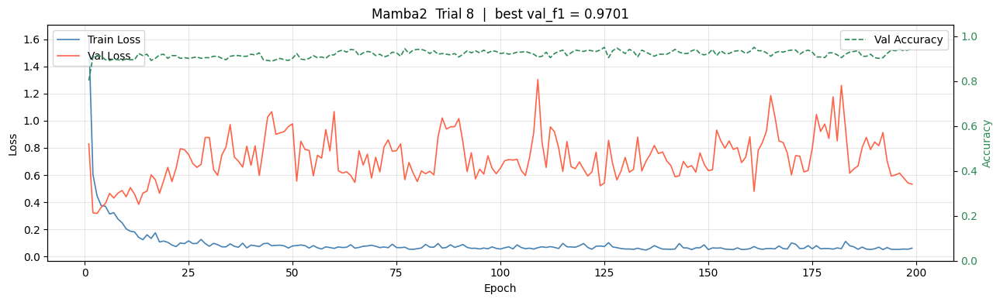

  [Mamba2] trial  9 (COMPLETE ) val_f1=0.9663  best=0.9701  (done=10, pruned=0)


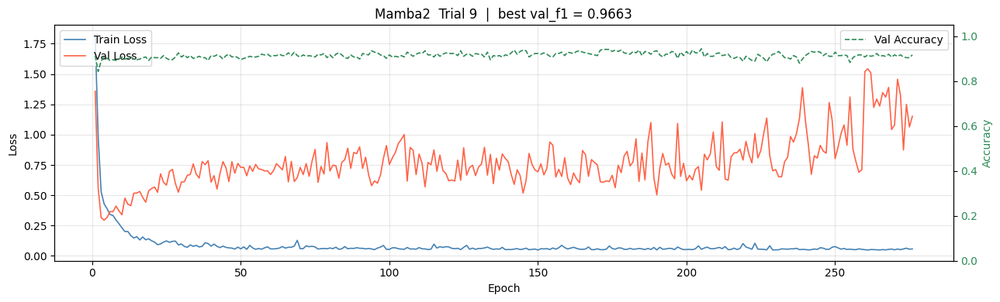

  [Mamba2] trial 10 (COMPLETE ) val_f1=0.9576  best=0.9701  (done=11, pruned=0)


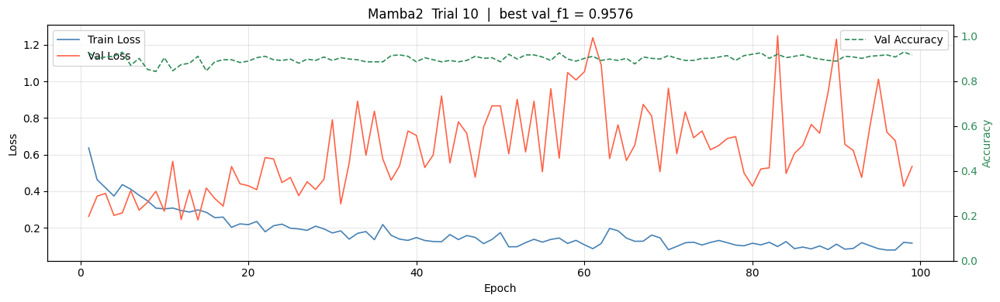

  [Mamba2] trial 11 (COMPLETE ) val_f1=0.9665  best=0.9701  (done=12, pruned=0)


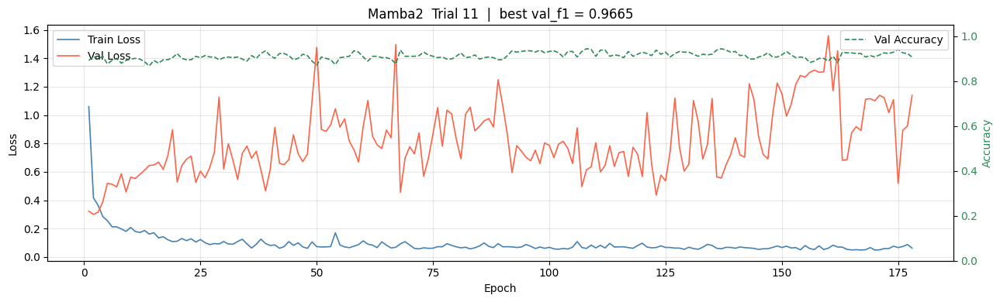

  [Mamba2] trial 12 (COMPLETE ) val_f1=0.9630  best=0.9701  (done=13, pruned=0)


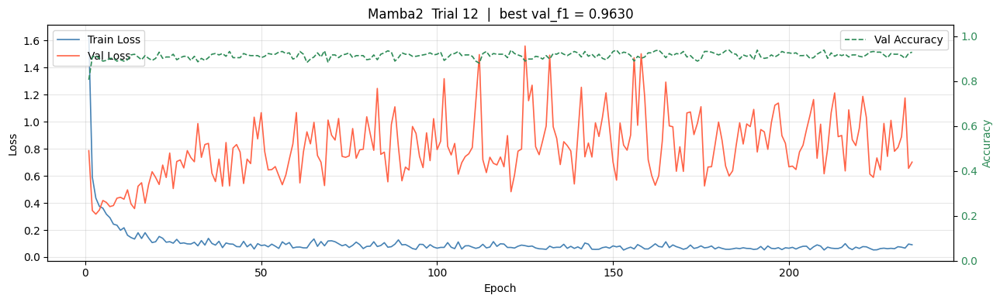

  [Mamba2] trial 13 (COMPLETE ) val_f1=0.9489  best=0.9701  (done=14, pruned=0)


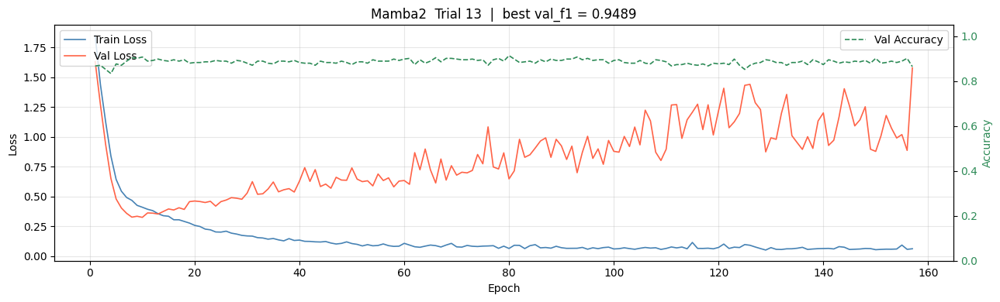

  [Mamba2] trial 14 (COMPLETE ) val_f1=0.9612  best=0.9701  (done=15, pruned=0)


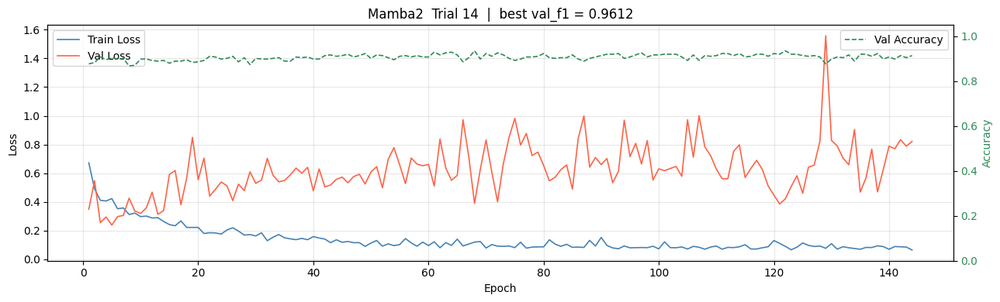

  Best: trial 2  val_f1=0.9701
  Params: {'lr': 0.0015304852121831463, 'wd': 1.3783237455007187e-05, 'dropout': 0.24301794076057537, 'bs': 128, 'd_model': 32, 'd_state': 16, 'n_layers': 1, 'patience': 75}
  E4 Overall F1: 0.9503

 Model: iTransformer   study: stage1_Norm_iTransformer
  Resuming from trial 0, running 15 more.
  [iTransformer] trial  0 (COMPLETE ) val_f1=0.8995  best=0.8995  (done=1, pruned=0)


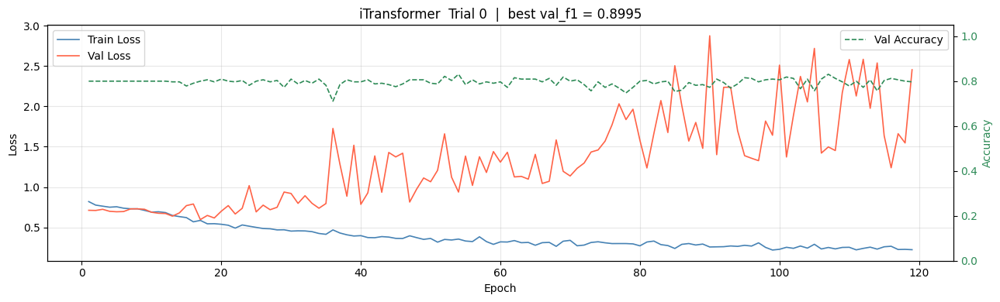

  [iTransformer] trial  1 (COMPLETE ) val_f1=0.9004  best=0.9004  (done=2, pruned=0)


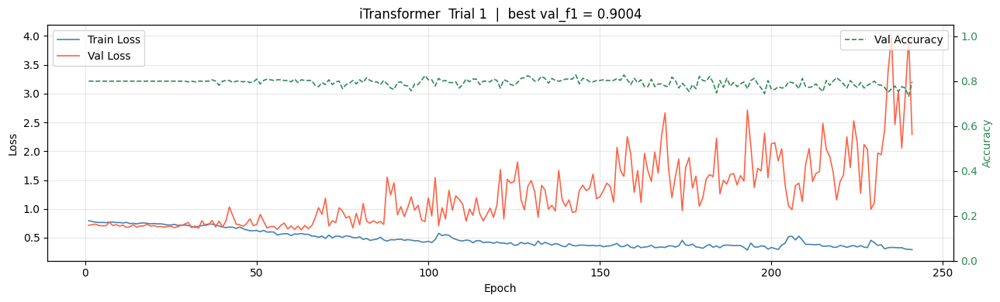

  [iTransformer] trial  2 (COMPLETE ) val_f1=0.8889  best=0.9004  (done=3, pruned=0)


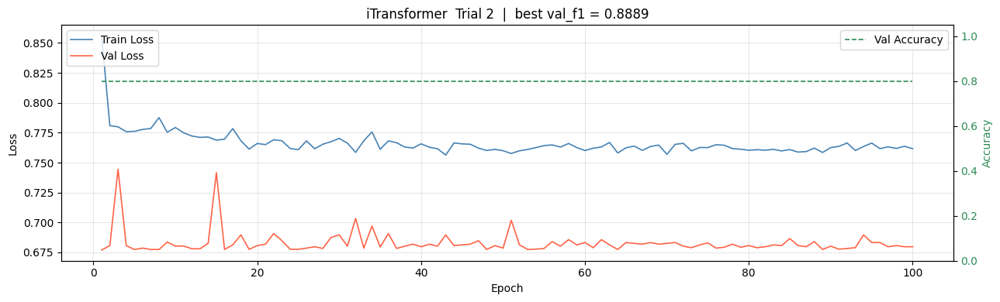

  [iTransformer] trial  3 (COMPLETE ) val_f1=0.8936  best=0.9004  (done=4, pruned=0)


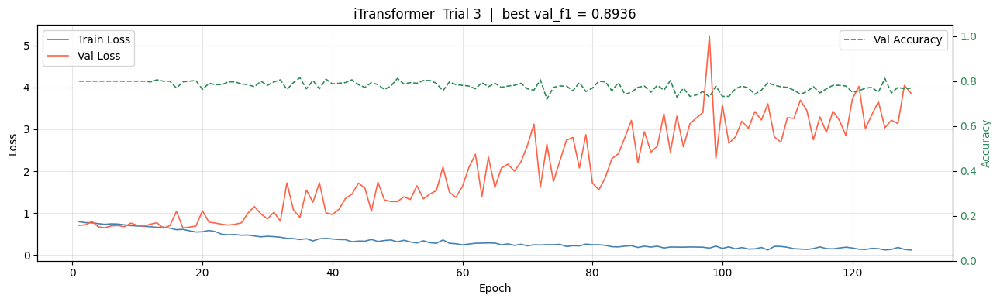

  [iTransformer] trial  4 (COMPLETE ) val_f1=0.8889  best=0.9004  (done=5, pruned=0)


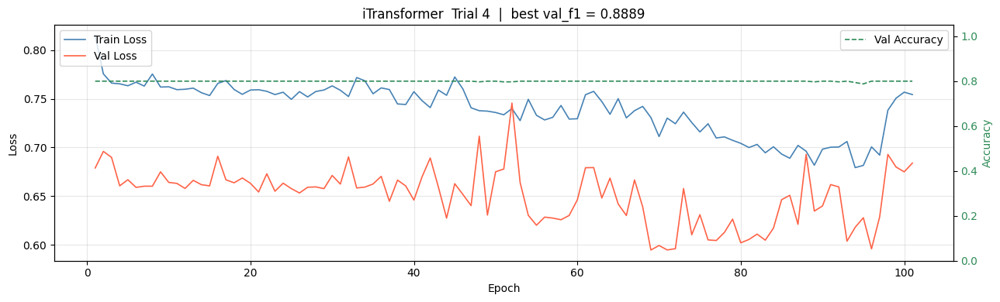

  [iTransformer] trial  5 (COMPLETE ) val_f1=0.8889  best=0.9004  (done=6, pruned=0)


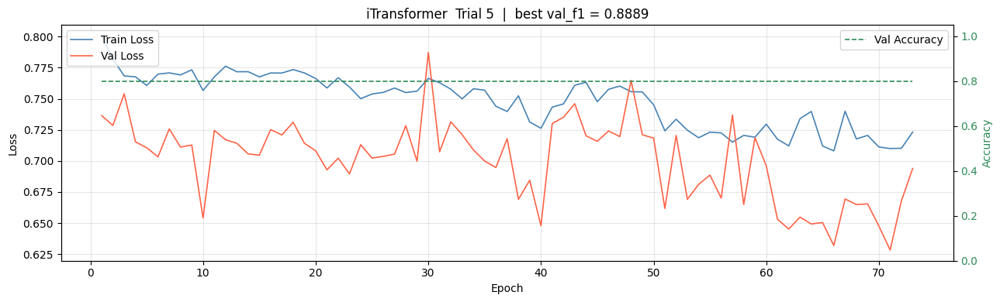

  [iTransformer] trial  6 (COMPLETE ) val_f1=0.9107  best=0.9107  (done=7, pruned=0)


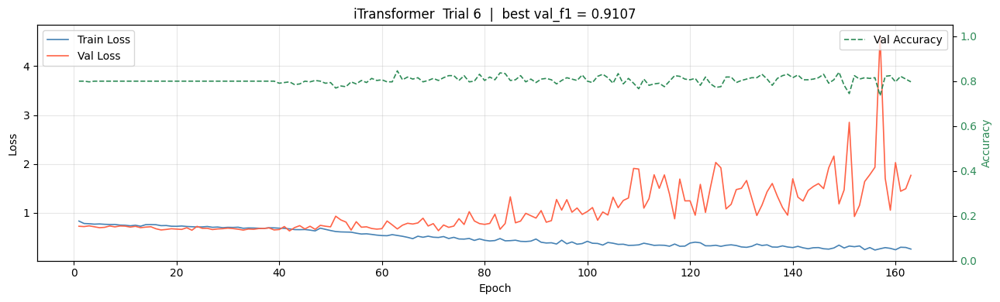

  [iTransformer] trial  7 (COMPLETE ) val_f1=0.8889  best=0.9107  (done=8, pruned=0)


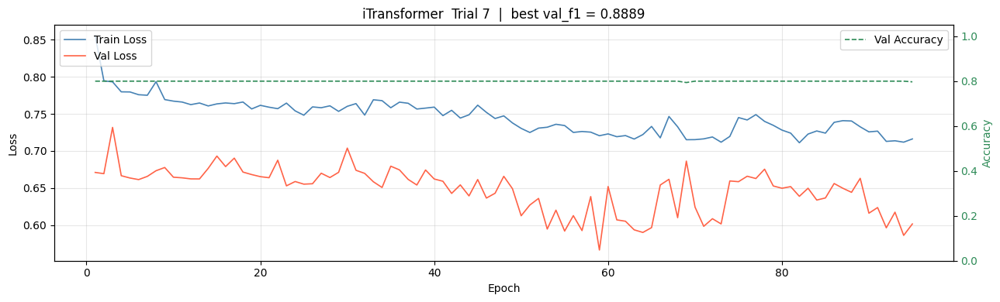

  [iTransformer] trial  8 (COMPLETE ) val_f1=0.8889  best=0.9107  (done=9, pruned=0)


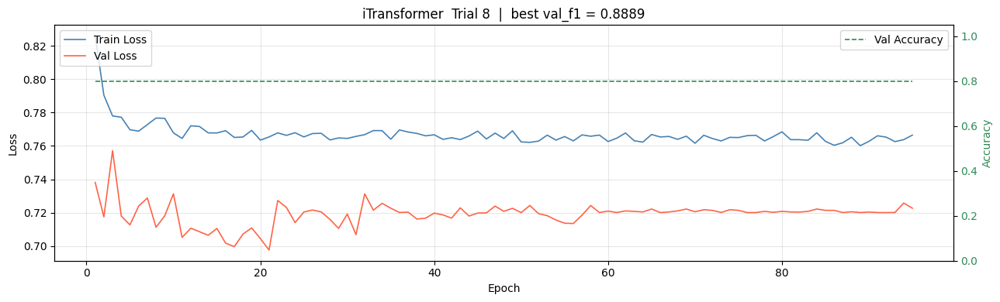

  [iTransformer] trial  9 (COMPLETE ) val_f1=0.8942  best=0.9107  (done=10, pruned=0)


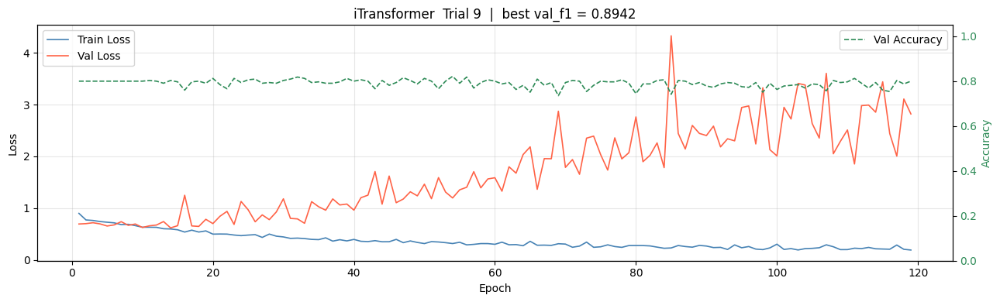

  [iTransformer] trial 10 (COMPLETE ) val_f1=0.8964  best=0.9107  (done=11, pruned=0)


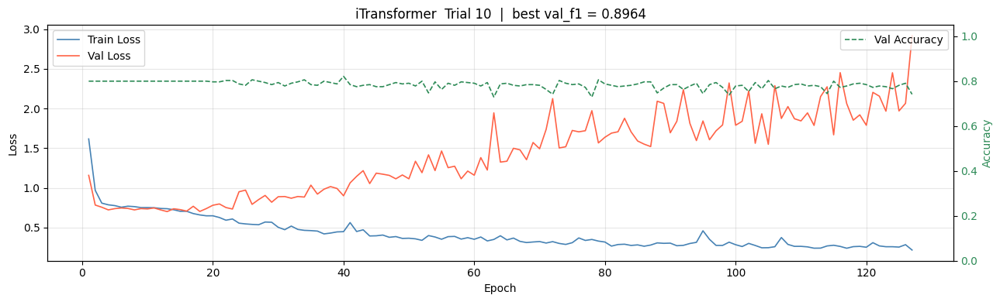

  [iTransformer] trial 11 (COMPLETE ) val_f1=0.9022  best=0.9107  (done=12, pruned=0)


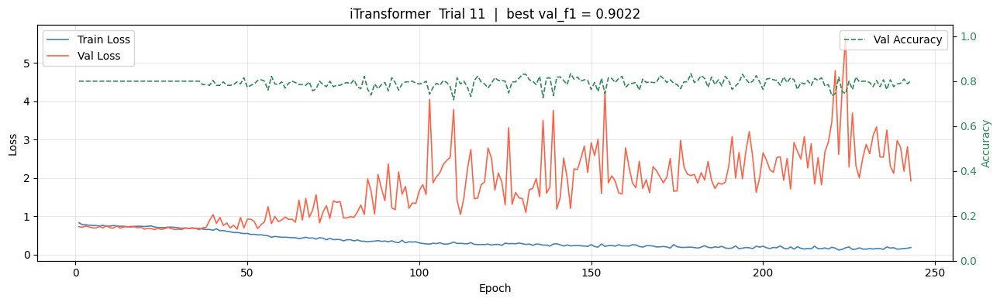

  [iTransformer] trial 12 (COMPLETE ) val_f1=0.8889  best=0.9107  (done=13, pruned=0)


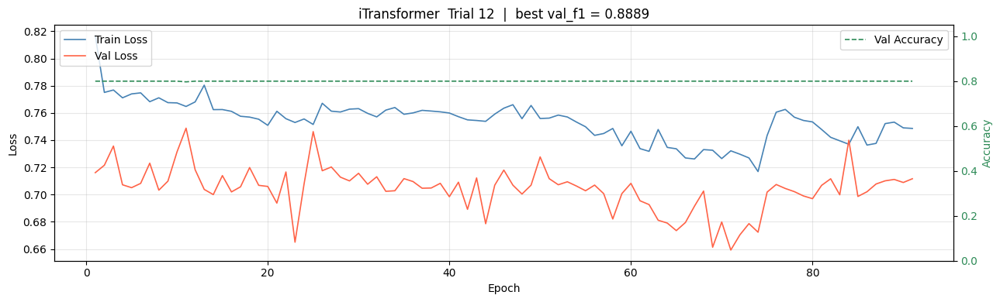

  [iTransformer] trial 13 (COMPLETE ) val_f1=0.8889  best=0.9107  (done=14, pruned=0)


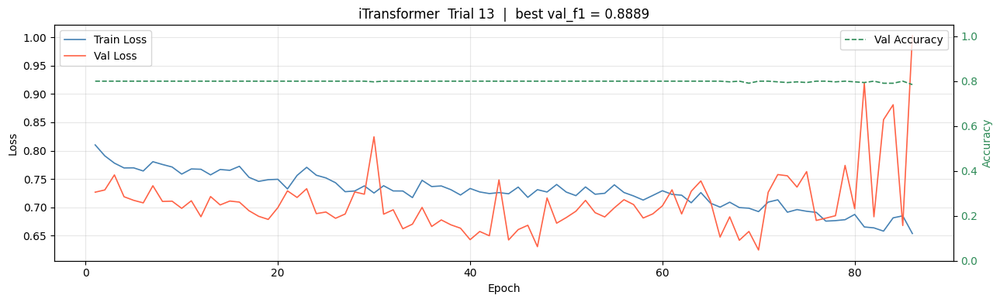

  [iTransformer] trial 14 (COMPLETE ) val_f1=0.8889  best=0.9107  (done=15, pruned=0)


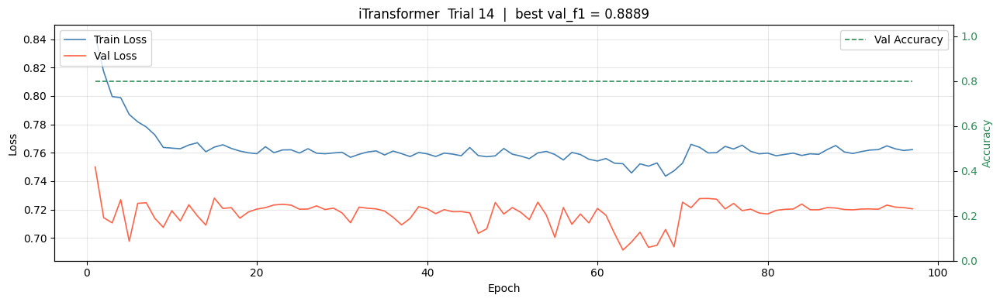

  Best: trial 6  val_f1=0.9107
  Params: {'lr': 0.003154605390535428, 'wd': 0.00025327773734505865, 'dropout': 0.23132651175200253, 'bs': 32, 'd_model': 64, 'n_heads': 8, 'n_layers': 1, 'd_ff': 128, 'patience': 100}
  E4 Overall F1: 0.9415

 Model: PatchTST   study: stage1_Norm_PatchTST
  Resuming from trial 0, running 15 more.
  [PatchTST] trial  0 (COMPLETE ) val_f1=0.9423  best=0.9423  (done=1, pruned=0)


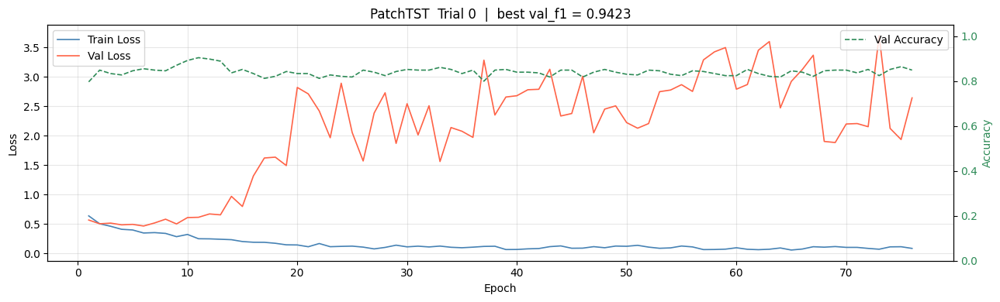

  [PatchTST] trial  1 (COMPLETE ) val_f1=0.9567  best=0.9567  (done=2, pruned=0)


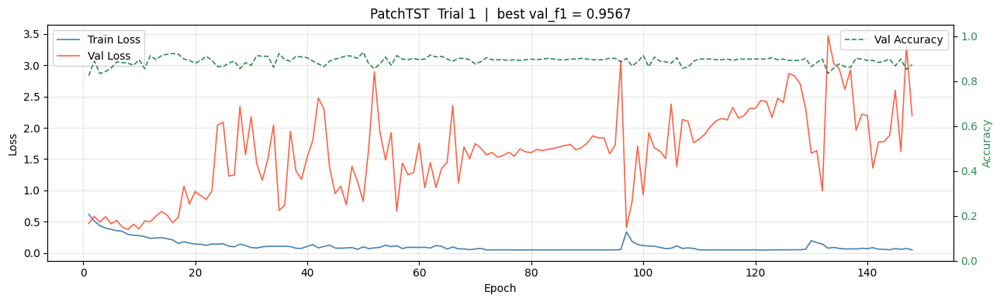

  [PatchTST] trial  2 (COMPLETE ) val_f1=0.9282  best=0.9567  (done=3, pruned=0)


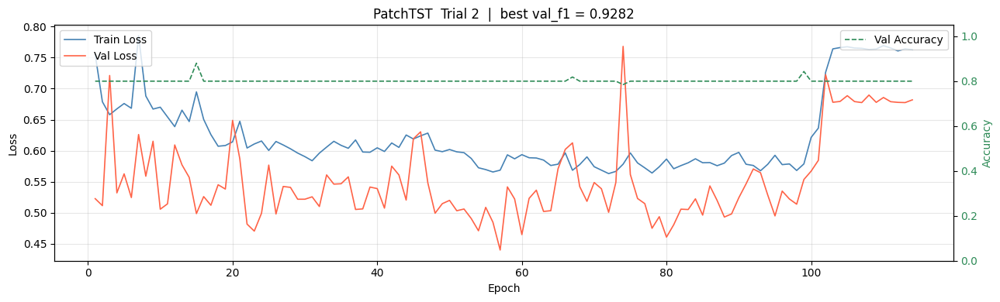

  [PatchTST] trial  3 (COMPLETE ) val_f1=0.9508  best=0.9567  (done=4, pruned=0)


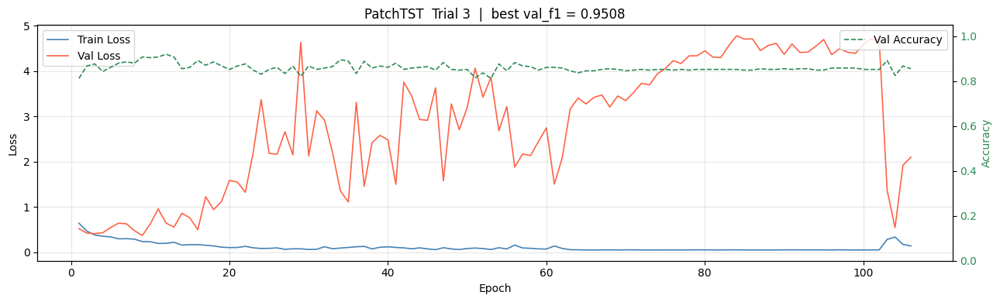

  [PatchTST] trial  4 (COMPLETE ) val_f1=0.9524  best=0.9567  (done=5, pruned=0)


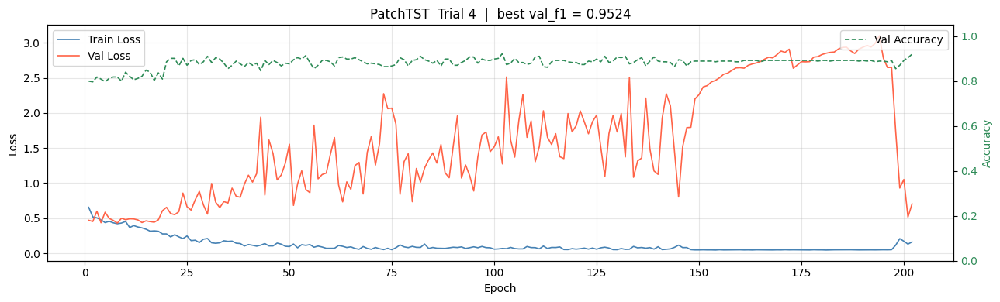

  [PatchTST] trial  5 (COMPLETE ) val_f1=0.9557  best=0.9567  (done=6, pruned=0)


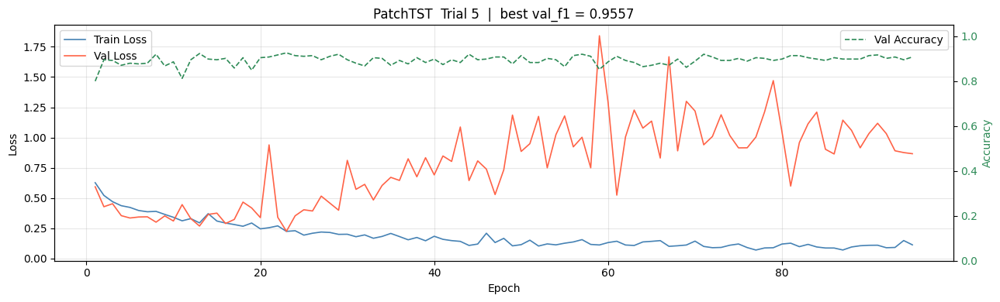

  [PatchTST] trial  6 (COMPLETE ) val_f1=0.9593  best=0.9593  (done=7, pruned=0)


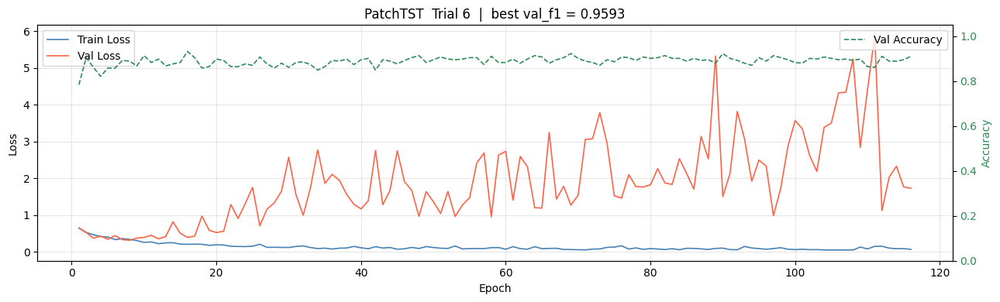

  [PatchTST] trial  7 (COMPLETE ) val_f1=0.9591  best=0.9593  (done=8, pruned=0)


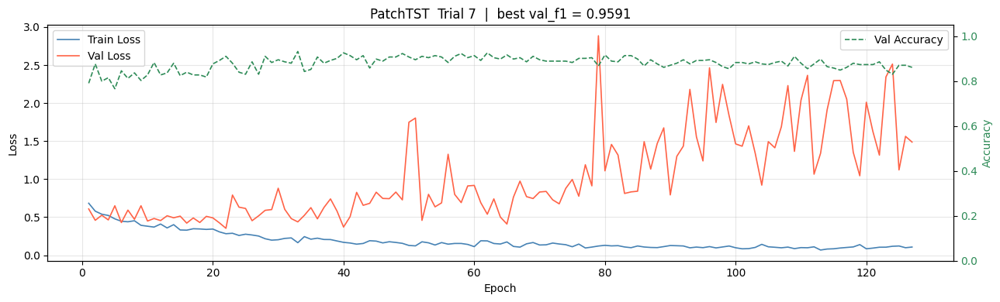

  [PatchTST] trial  8 (COMPLETE ) val_f1=0.9416  best=0.9593  (done=9, pruned=0)


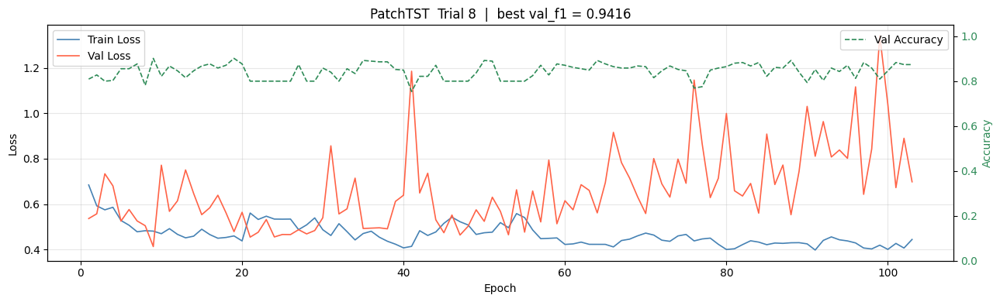

  [PatchTST] trial  9 (COMPLETE ) val_f1=0.9534  best=0.9593  (done=10, pruned=0)


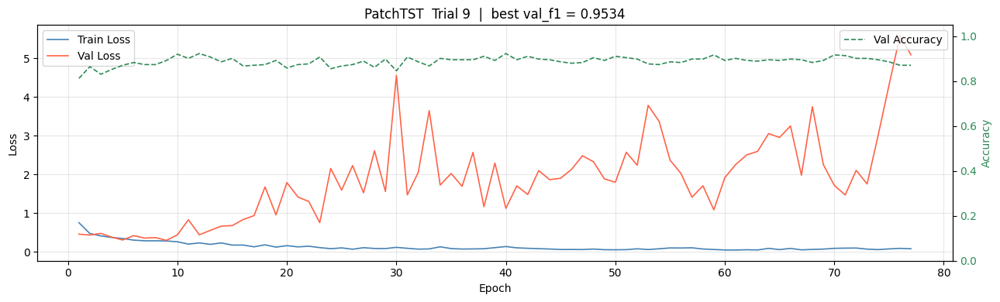

  [PatchTST] trial 10 (COMPLETE ) val_f1=0.9534  best=0.9593  (done=11, pruned=0)


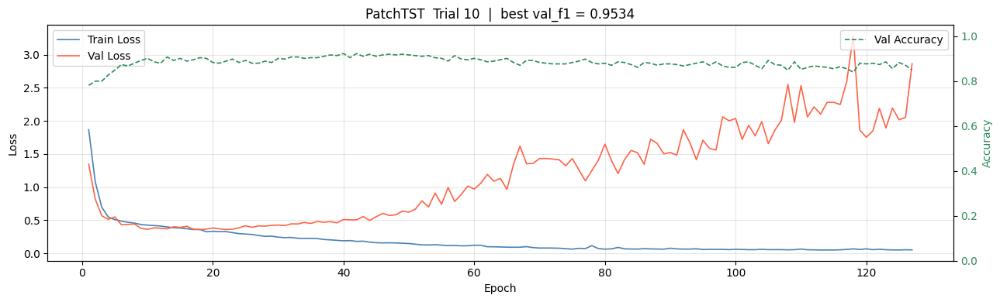

  [PatchTST] trial 11 (COMPLETE ) val_f1=0.9609  best=0.9609  (done=12, pruned=0)


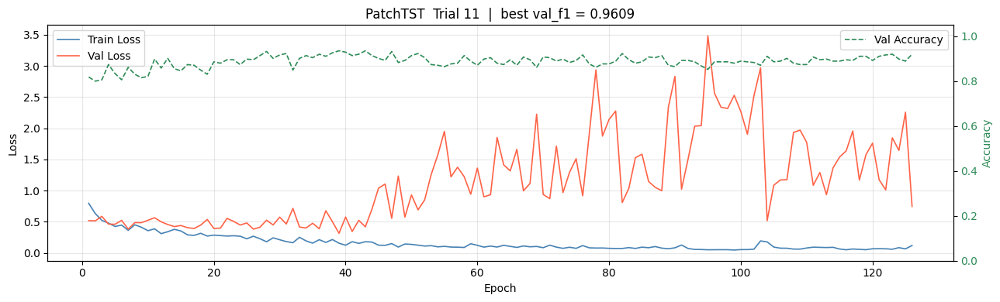

  [PatchTST] trial 12 (COMPLETE ) val_f1=0.9556  best=0.9609  (done=13, pruned=0)


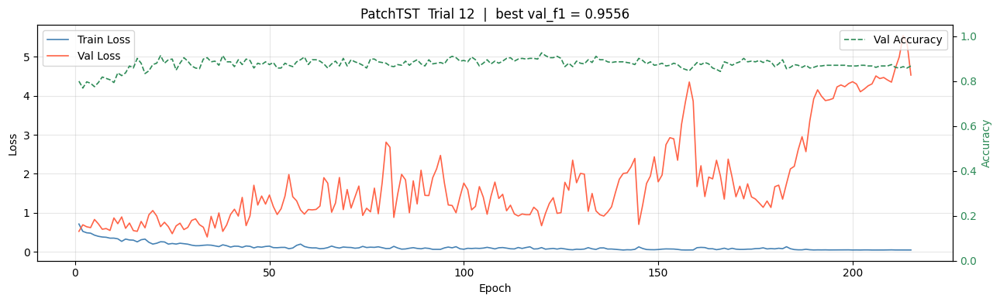

  [PatchTST] trial 13 (COMPLETE ) val_f1=0.9398  best=0.9609  (done=14, pruned=0)


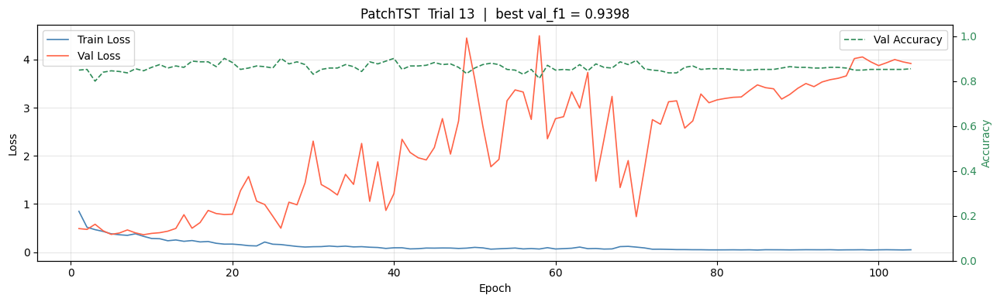

  [PatchTST] trial 14 (COMPLETE ) val_f1=0.8901  best=0.9609  (done=15, pruned=0)


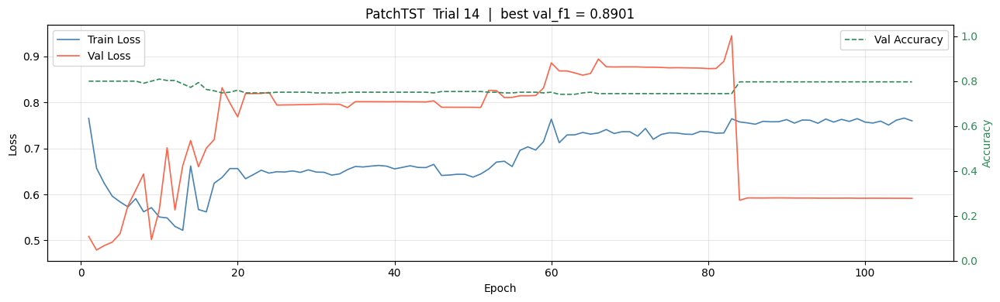

  Best: trial 11  val_f1=0.9609
  Params: {'lr': 0.008270403581566253, 'wd': 0.0005487803045311022, 'dropout': 0.2814739059767606, 'bs': 128, 'd_model': 64, 'n_heads': 8, 'n_layers': 1, 'd_ff': 512, 'patience': 87}
  E4 Overall F1: 0.8916

 Model: TransformerCNN   study: stage1_Norm_TransformerCNN
  Resuming from trial 0, running 15 more.
  [TransformerCNN] trial  0 (COMPLETE ) val_f1=0.9609  best=0.9609  (done=1, pruned=0)


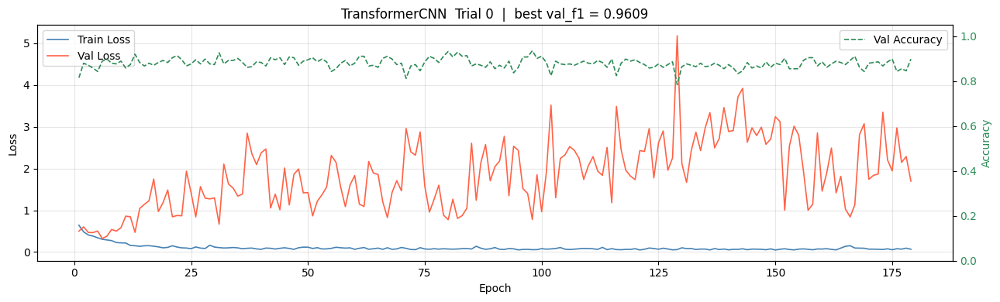

  [TransformerCNN] trial  1 (COMPLETE ) val_f1=0.9412  best=0.9609  (done=2, pruned=0)


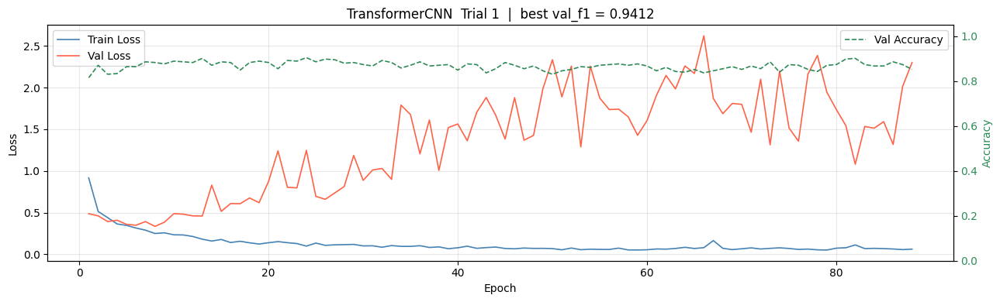

  [TransformerCNN] trial  2 (COMPLETE ) val_f1=0.9663  best=0.9663  (done=3, pruned=0)


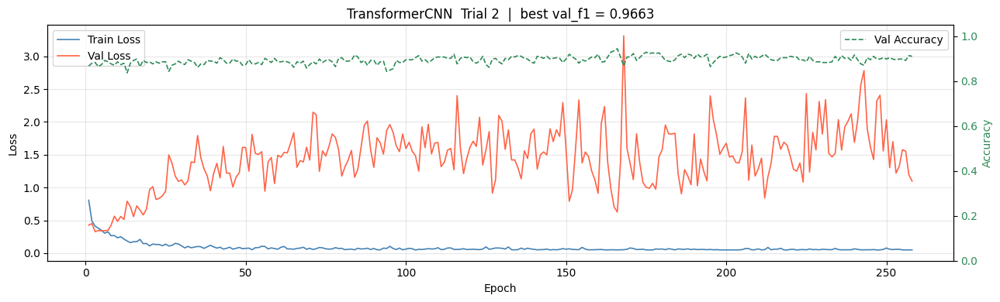

  [TransformerCNN] trial  3 (COMPLETE ) val_f1=0.9534  best=0.9663  (done=4, pruned=0)


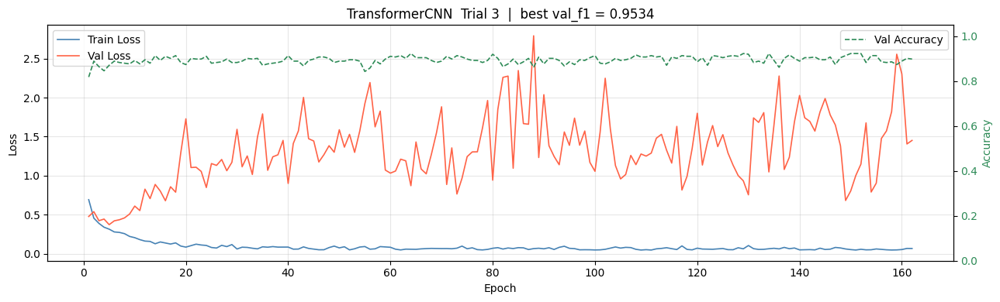

  [TransformerCNN] trial  4 (COMPLETE ) val_f1=0.9621  best=0.9663  (done=5, pruned=0)


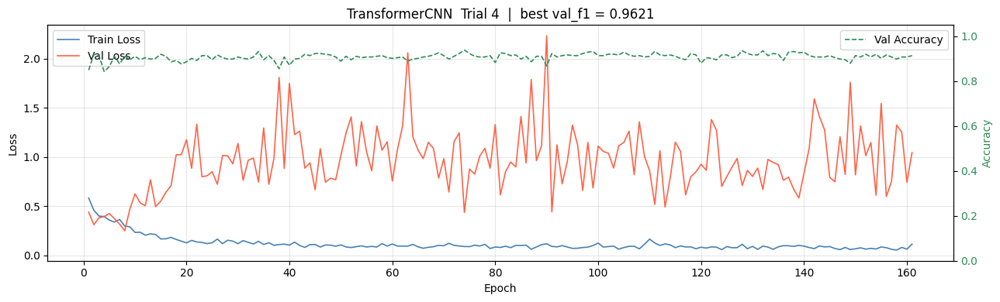

  [TransformerCNN] trial  5 (COMPLETE ) val_f1=0.9609  best=0.9663  (done=6, pruned=0)


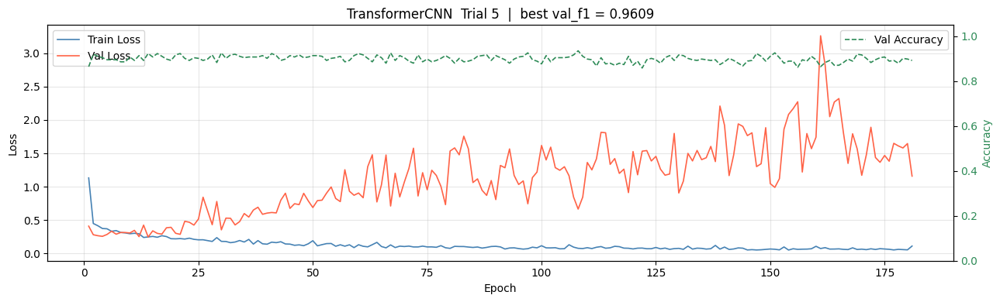

  [TransformerCNN] trial  6 (COMPLETE ) val_f1=0.9583  best=0.9663  (done=7, pruned=0)


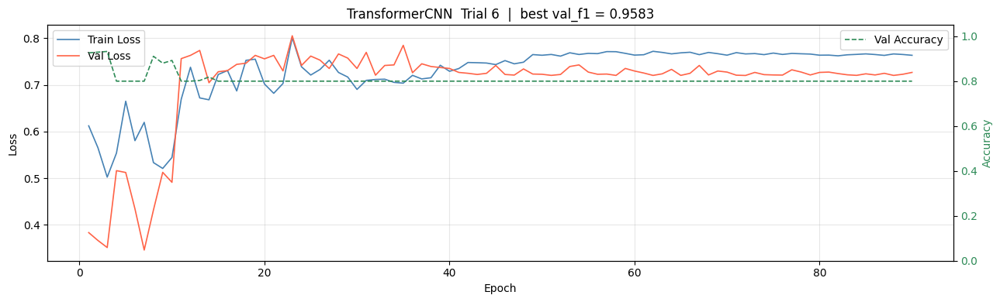

  [TransformerCNN] trial  7 (COMPLETE ) val_f1=0.9509  best=0.9663  (done=8, pruned=0)


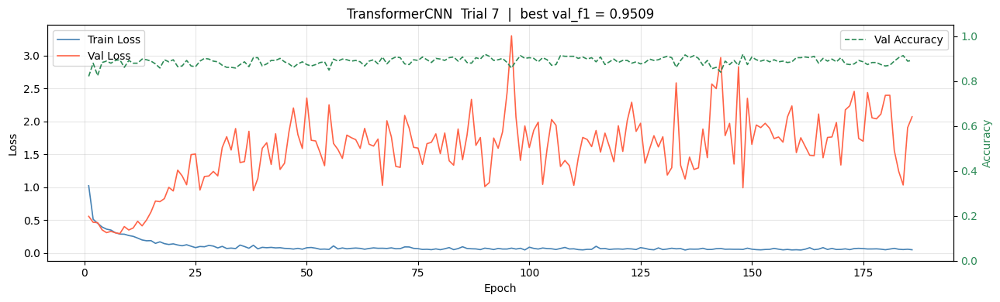

  [TransformerCNN] trial  8 (COMPLETE ) val_f1=0.9660  best=0.9663  (done=9, pruned=0)


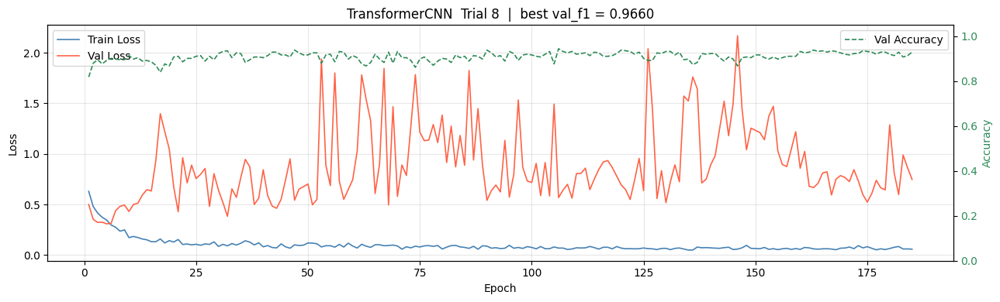

  [TransformerCNN] trial  9 (COMPLETE ) val_f1=0.9420  best=0.9663  (done=10, pruned=0)


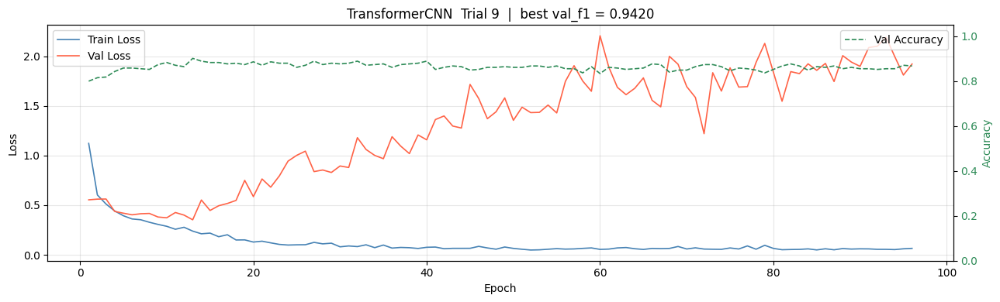

  [TransformerCNN] trial 10 (COMPLETE ) val_f1=0.9519  best=0.9663  (done=11, pruned=0)


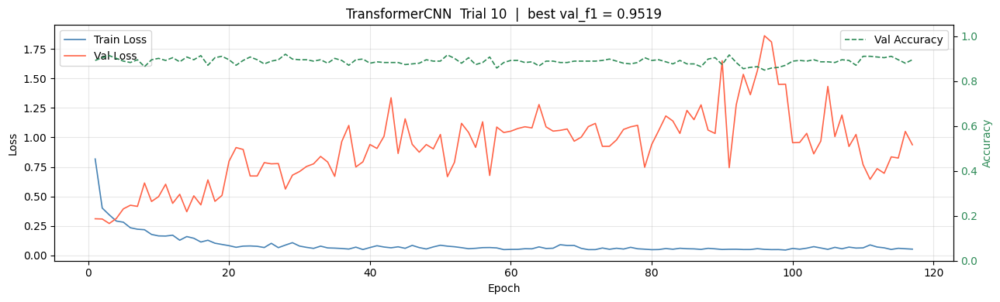

  [TransformerCNN] trial 11 (COMPLETE ) val_f1=0.9647  best=0.9663  (done=12, pruned=0)


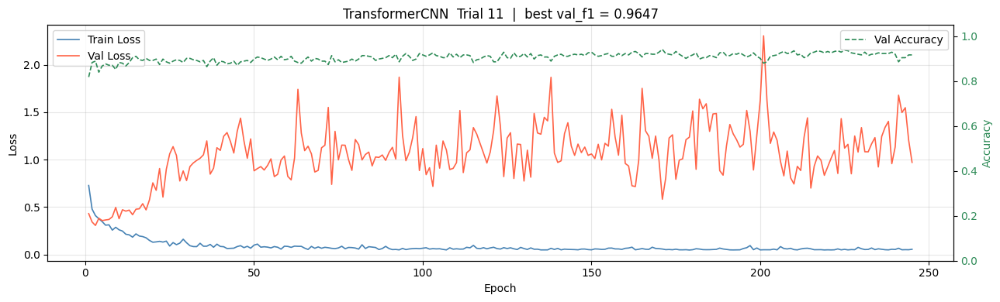

  [TransformerCNN] trial 12 (COMPLETE ) val_f1=0.9403  best=0.9663  (done=13, pruned=0)


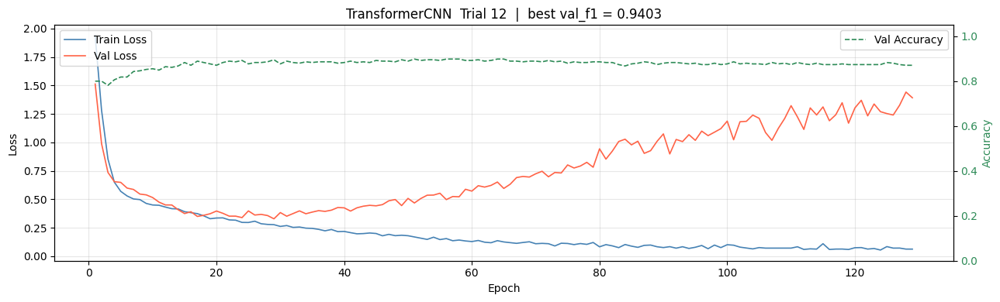

  [TransformerCNN] trial 13 (COMPLETE ) val_f1=0.9677  best=0.9677  (done=14, pruned=0)


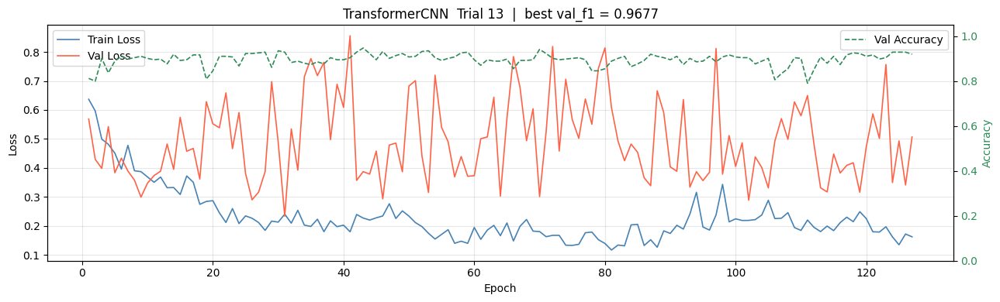

  [TransformerCNN] trial 14 (COMPLETE ) val_f1=0.8889  best=0.9677  (done=15, pruned=0)


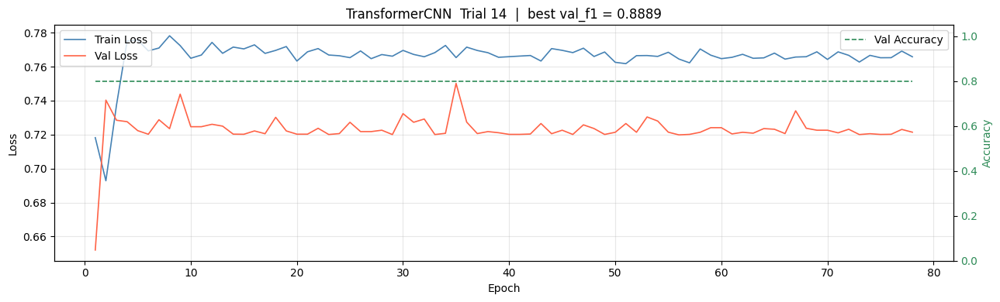

  Best: trial 13  val_f1=0.9677
  Params: {'lr': 0.0010667854913765397, 'wd': 0.001987920410106473, 'dropout': 0.029481303093946636, 'bs': 32, 'd_model': 256, 'n_heads': 8, 'n_layers': 3, 'd_ff': 128, 'n_conv_layers': 1, 'cnn_kernel': 7, 'patience': 84}
  E4 Overall F1: 0.9124

Search complete.


In [9]:
# ── Optuna search loop ────────────────────────────────────────────────────────
import time

e4_results_all: dict[str, dict | None] = {}
study_results:  dict[str, optuna.Study | None] = {}
all_results:    list[dict] = []

for model_name in MODELS:
    study_name = f'stage1_Norm_{model_name}'
    print(f'\n{"="*60}')
    print(f' Model: {model_name}   study: {study_name}')
    print(f'{"="*60}')

    sampler = TPESampler(n_startup_trials=3, multivariate=True, seed=42)
    pruner  = NopPruner()

    study = optuna.create_study(
        study_name=study_name,
        storage=STORAGE,
        sampler=sampler,
        pruner=pruner,
        direction='maximize',
        load_if_exists=True,
    )

    n_done = len([t for t in study.trials
                  if t.state in (optuna.trial.TrialState.COMPLETE,
                                 optuna.trial.TrialState.PRUNED)])
    n_remaining = max(0, N_TRIALS - n_done)

    if n_remaining == 0:
        print(f'  Already completed {n_done} trials — skipping.')
    else:
        print(f'  Resuming from trial {n_done}, running {n_remaining} more.')
        t0 = time.perf_counter()

        objective, best_f1_ref, best_hp_ref, trial_histories = make_objective_2000(
            model_name=model_name,
            x_train=x_train, y_train=y_train,
            x_val=x_val,     y_val=y_val,
            W=W, n_channels=N_CHANNELS,
            pos_weight=POS_WEIGHT,
            device=DEVICE,
            save_dir=SAVE_DIR,
            epochs=EPOCHS,
            chronos_pipeline=chronos_pipeline,
        )
        study.optimize(
            objective,
            n_trials=n_remaining,
            callbacks=[make_callbacks(model_name, trial_histories)],
            catch=(Exception,),
        )
        elapsed_min = (time.perf_counter() - t0) / 60.0
        study.set_user_attr('total_time_min', elapsed_min)

    study_results[model_name] = study
    best_ckpt_path = finalize_best_checkpoint(study, model_name, SAVE_DIR)

    completed = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
    if completed:
        best_trial = max(completed, key=lambda t: t.value)
        model_row = {
            'model':    model_name,
            'val_f1':   best_trial.value,
            'trial_no': best_trial.number,
            **best_trial.params,
        }
        print(f'  Best: trial {best_trial.number}  val_f1={best_trial.value:.4f}')
        print(f'  Params: {best_trial.params}')

        if best_ckpt_path is not None:
            ckpt = torch.load(best_ckpt_path, map_location=DEVICE)
            best_hp = {k: v for k, v in ckpt['hp'].items() if k not in {'bs', 'lr', 'wd', 'patience'}}
            if model_name == 'Chronos2':
                best_hp['pipeline'] = chronos_pipeline
            best_model = build_model(model_name, W=W, n_channels=N_CHANNELS, **best_hp).to(DEVICE)
            best_model.load_state_dict(ckpt['model_state_dict'])

            e4_result = evaluate_on_e4(best_model, e4_data_per_subject, DEVICE, use_bf16=USE_BF16)
            e4_results_all[model_name] = e4_result
            model_row['e4_accuracy']  = e4_result['overall']['accuracy']  if e4_result['overall'] else float('nan')
            model_row['e4_f1']        = e4_result['overall']['f1']        if e4_result['overall'] else float('nan')
            model_row['e4_precision'] = e4_result['overall']['precision'] if e4_result['overall'] else float('nan')
            model_row['e4_recall']    = e4_result['overall']['recall']    if e4_result['overall'] else float('nan')
            model_row['e4_auroc']     = e4_result['overall'].get('auroc', float('nan')) if e4_result['overall'] else float('nan')
            print(f"  E4 Overall F1: {model_row['e4_f1']:.4f}")
            del best_model
            torch.cuda.empty_cache()
        else:
            e4_results_all[model_name] = None
            for k in ('e4_accuracy', 'e4_f1', 'e4_precision', 'e4_recall', 'e4_auroc'):
                model_row[k] = float('nan')

        all_results.append(model_row)
    else:
        all_results.append({
            'model': model_name, 'val_f1': float('nan'), 'trial_no': -1,
            'e4_accuracy': float('nan'), 'e4_f1': float('nan'),
            'e4_precision': float('nan'), 'e4_recall': float('nan'), 'e4_auroc': float('nan'),
        })
        e4_results_all[model_name] = None
        print('  No completed trials.')

print('\nSearch complete.')

In [10]:
# ── Results summary ───────────────────────────────────────────────────────────
df = pd.DataFrame(all_results).sort_values('val_f1', ascending=False).reset_index(drop=True)
csv_path = SAVE_DIR / 'optuna_stage1_results.csv'
df.to_csv(csv_path, index=False)
print(f'Saved → {csv_path}')
display(df[['model', 'val_f1', 'e4_f1', 'e4_accuracy', 'trial_no']].round(4))

e4_json_path = SAVE_DIR / 'e4_results_stage1.json'
with open(e4_json_path, 'w') as f:
    json.dump(e4_results_all, f, indent=2)
print(f'E4 results saved → {e4_json_path}')

Saved → Save_model_ALL_Norm/optuna_stage1_results.csv


,model,val_f1,e4_f1,e4_accuracy,trial_no
0,CrossGNN,0.9756,0.9439,0.8987,6
1,TimesNet,0.9720,0.9014,0.8256,12
2,Mamba2,0.9701,0.9503,0.9064,2
3,TransformerCNN,0.9677,0.9124,0.8436,13
4,ModernTCN,0.9644,0.8767,0.7872,10
5,Medformer,0.9625,0.9437,0.8949,4
6,PatchTST,0.9609,0.8916,0.8077,11
7,TimeMixerPP,0.9576,0.9500,0.9064,11
8,TSLANet,0.9575,0.8972,0.8167,11
9,iTransformer,0.9107,0.9415,0.8897,6


E4 results saved → Save_model_ALL_Norm/e4_results_stage1.json


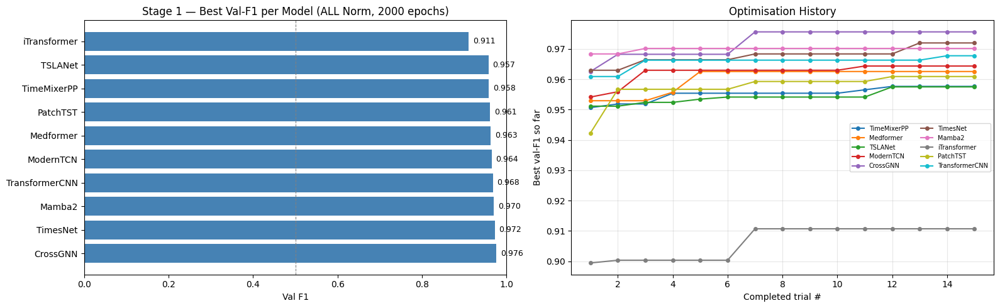

Figure saved → Save_model_ALL_Norm/optuna_stage1_results.png


In [11]:
# ── Visualisation ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

ax = axes[0]
colors = ['steelblue' if v >= 0.5 else 'salmon' for v in df['val_f1'].fillna(0)]
ax.barh(df['model'], df['val_f1'].fillna(0), color=colors)
ax.axvline(0.5, color='gray', linestyle='--', linewidth=0.8)
ax.set_xlabel('Val F1')
ax.set_title('Stage 1 — Best Val-F1 per Model (ALL Norm, 2000 epochs)')
ax.set_xlim(0, 1)
for i, (_, row) in enumerate(df.iterrows()):
    ax.text(row['val_f1'] + 0.01 if not pd.isna(row['val_f1']) else 0.01,
            i, f"{row['val_f1']:.3f}" if not pd.isna(row['val_f1']) else 'N/A',
            va='center', fontsize=9)

ax2 = axes[1]
for model_name in MODELS:
    study_name = f'stage1_Norm_{model_name}'
    try:
        study = optuna.load_study(study_name=study_name, storage=STORAGE)
        completed = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
        if completed:
            vals = [t.value for t in completed]
            best_so_far = [max(vals[:i+1]) for i in range(len(vals))]
            ax2.plot(range(1, len(best_so_far) + 1), best_so_far,
                     marker='o', markersize=4, label=model_name)
    except Exception:
        pass
ax2.set_xlabel('Completed trial #')
ax2.set_ylabel('Best val-F1 so far')
ax2.set_title('Optimisation History')
ax2.legend(fontsize=7, ncol=2)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
fig_path = SAVE_DIR / 'optuna_stage1_results.png'
plt.savefig(fig_path, dpi=150)
plt.show()
print(f'Figure saved → {fig_path}')

In [12]:
# ── Stage 1 Summary / Comparison Artifacts ───────────────────────────────────
import importlib
import ALL_optuna_utils as ou
ou = importlib.reload(ou)

summary_df     = ou.generate_stage1_summary(study_results, e4_results_all, SAVE_DIR)
per_subject_df = ou.save_per_subject_results(e4_results_all, SAVE_DIR)

print('\n=== Stage 1 Summary (sorted by E4 F1) ===')
try:
    display(
        summary_df[['model', 'status', 'best_val_f1', 'e4_f1', 'e4_accuracy',
                    'e4_precision', 'e4_recall', 'e4_auroc',
                    'n_trials_completed', 'n_trials_pruned']]
        .style
        .format({c: '{:.4f}' for c in ['best_val_f1', 'e4_f1', 'e4_accuracy',
                                       'e4_precision', 'e4_recall', 'e4_auroc']},
                na_rep='N/A')
        .background_gradient(cmap='YlGn', subset=['best_val_f1', 'e4_f1'])
    )
except Exception:
    print(summary_df)

summary_json_path = SAVE_DIR / 'stage1_summary.json'
summary_df.to_json(summary_json_path, orient='records', indent=2)
print(f'Saved: {summary_json_path}')

Saved: Save_model_ALL_Norm/stage1_summary.csv
Saved: Save_model_ALL_Norm/stage1_per_subject.csv

=== Stage 1 Summary (sorted by E4 F1) ===


,model,status,best_val_f1,e4_f1,e4_accuracy,e4_precision,e4_recall,e4_auroc,n_trials_completed,n_trials_pruned
0,Mamba2,OK,0.9701,0.9503,0.9064,0.9100,0.9943,0.6755,15,0
1,TimeMixerPP,OK,0.9576,0.9500,0.9064,0.9144,0.9886,0.8771,15,0
2,CrossGNN,OK,0.9756,0.9439,0.8987,0.9406,0.9473,0.7346,15,0
3,Medformer,OK,0.9625,0.9437,0.8949,0.9111,0.9786,0.7322,15,0
4,iTransformer,OK,0.9107,0.9415,0.8897,0.9010,0.9858,0.5488,15,0
5,TransformerCNN,OK,0.9677,0.9124,0.8436,0.9203,0.9046,0.7181,15,0
6,TimesNet,OK,0.9720,0.9014,0.8256,0.9174,0.8860,0.6159,15,0
7,TSLANet,OK,0.9575,0.8972,0.8167,0.9057,0.8889,0.6760,15,0
8,PatchTST,OK,0.9609,0.8916,0.8077,0.9047,0.8789,0.7234,15,0
9,ModernTCN,OK,0.9644,0.8767,0.7872,0.9161,0.8405,0.6430,15,0


Saved: Save_model_ALL_Norm/stage1_summary.json


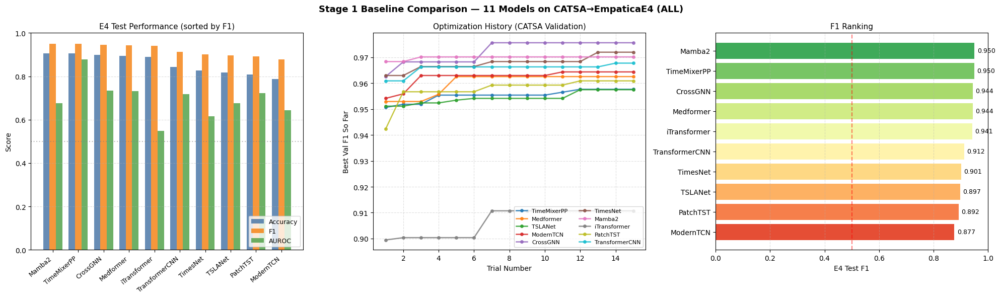

Saved: Save_model_ALL_Norm/stage1_comparison.png


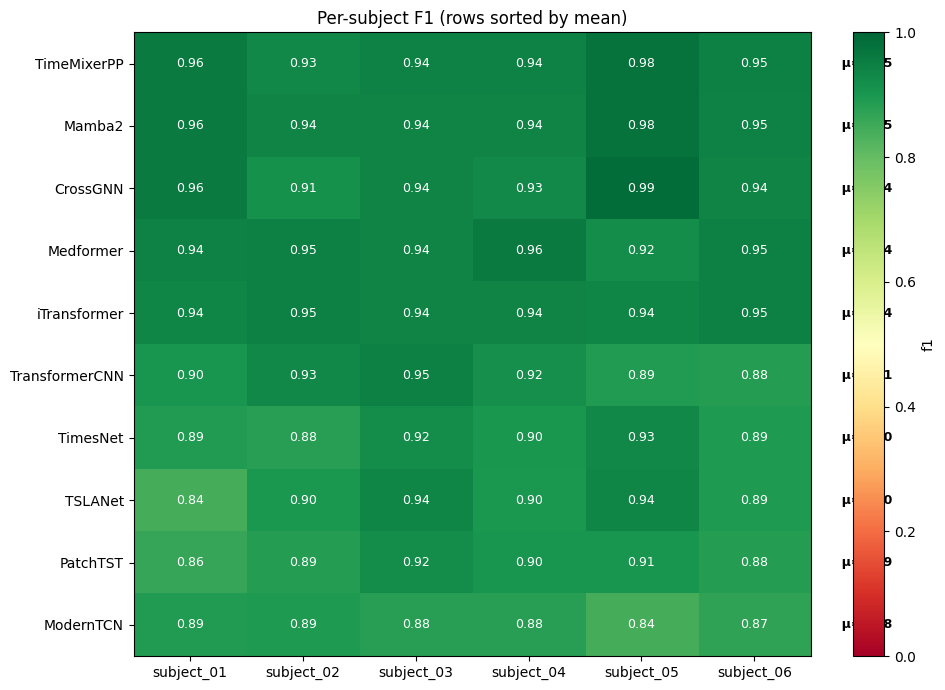

Saved: Save_model_ALL_Norm/stage1_per_subject_heatmap_f1.png
Plots saved to: Save_model_ALL_Norm/optuna_results

Comparison artifacts generated.


In [13]:
# ── Stage 1 Comparison Figures ────────────────────────────────────────────────
ou.plot_stage1_comparison(summary_df, study_results, SAVE_DIR, signal_name=SIGNAL)
ou.plot_per_subject_heatmap(per_subject_df, SAVE_DIR, metric='f1')
ou.save_hp_importance_plots(study_results, SAVE_DIR)

print('\nComparison artifacts generated.')

In [14]:
# ── Best HPs per model (saved as JSON) ───────────────────────────────────────
best_hp_all: dict[str, dict] = {}
for model_name in MODELS:
    study_name = f'stage1_Norm_{model_name}'
    try:
        study = optuna.load_study(study_name=study_name, storage=STORAGE)
        completed = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
        if completed:
            best_trial = max(completed, key=lambda t: t.value)
            best_hp_all[model_name] = best_trial.params
    except Exception:
        pass

hp_json_path = SAVE_DIR / 'best_hp_stage1.json'
with open(hp_json_path, 'w') as f:
    json.dump(best_hp_all, f, indent=2)
print(f'Best HPs saved → {hp_json_path}')
for m, hp in best_hp_all.items():
    print(f'  {m:<16s}: {hp}')

Best HPs saved → Save_model_ALL_Norm/best_hp_stage1.json
  TimeMixerPP     : {'lr': 0.0016202162213232946, 'wd': 0.0002453031885254973, 'dropout': 0.037648755911789566, 'bs': 128, 'd_model': 256, 'n_blocks': 4, 'k_periods': 4, 'n_heads': 2, 'patience': 75}
  Medformer       : {'lr': 0.0018199961682604955, 'wd': 0.0009978565648095879, 'dropout': 0.26175060910830134, 'bs': 32, 'd_model': 128, 'n_heads': 4, 'n_layers': 1, 'patience': 67}
  TSLANet         : {'lr': 0.0009239759539528132, 'wd': 1.404776898323358e-05, 'dropout': 0.10633091672223487, 'bs': 64, 'd_model': 256, 'n_blocks': 2, 'patience': 83}
  ModernTCN       : {'lr': 0.00014631420737218462, 'wd': 1.1677536416705781e-05, 'dropout': 0.06586857772445559, 'bs': 32, 'd_model': 256, 'n_blocks': 1, 'patience': 61}
  CrossGNN        : {'lr': 0.00964321820344378, 'wd': 0.001548032798946949, 'dropout': 0.13758926013138395, 'bs': 32, 'd_model': 64, 'n_layers': 3, 'patience': 73}
  TimesNet        : {'lr': 0.0004033388431032321, 'wd': 0.0

In [15]:
# ── Final Stage 1 Report ──────────────────────────────────────────────────────
print('\n' + '=' * 72)
print('STAGE 1 BASELINE RESULTS  (ALL signals, 2000 epochs, per-subject norm)')
print('=' * 72)

valid = summary_df.dropna(subset=['e4_f1']).copy()
if len(valid) > 0:
    print('\nTop 3 models by E4 F1:')
    for rank, (_, row) in enumerate(valid.head(3).iterrows(), start=1):
        print(f"  {rank}. {row['model']:15s} | E4 F1: {row['e4_f1']:.4f} | Val F1: {row['best_val_f1']:.4f}")

    best_row = valid.iloc[0]
    print(f"\nBest model: {best_row['model']}")
    print(f"  Best HPs: lr={best_row['best_lr']:.2e}, bs={int(best_row['best_batch_size'])}, dropout={best_row['best_dropout']:.2f}")
    print(f"  Weight decay={best_row['best_weight_decay']:.2e}")
    print(f"  Model-specific: {best_row['best_model_specific']}")
    print(f"  E4 metrics: F1={best_row['e4_f1']:.4f}, Acc={best_row['e4_accuracy']:.4f}, AUROC={best_row['e4_auroc']:.4f}")

failed = summary_df[summary_df['status'] == 'FAILED']
if len(failed) > 0:
    print(f"\nFailed models: {failed['model'].tolist()}")

print('\nSaved outputs:')
print(f"  {SAVE_DIR / 'stage1_summary.csv'}")
print(f"  {SAVE_DIR / 'stage1_per_subject.csv'}")
print(f"  {SAVE_DIR / 'stage1_comparison.png'}")
print(f"  {SAVE_DIR / 'stage1_per_subject_heatmap_f1.png'}")
print(f"  {SAVE_DIR / 'optuna_results'}")
print('=' * 72)


STAGE 1 BASELINE RESULTS  (ALL signals, 2000 epochs, per-subject norm)

Top 3 models by E4 F1:
  1. Mamba2          | E4 F1: 0.9503 | Val F1: 0.9701
  2. TimeMixerPP     | E4 F1: 0.9500 | Val F1: 0.9576
  3. CrossGNN        | E4 F1: 0.9439 | Val F1: 0.9756

Best model: Mamba2
  Best HPs: lr=1.53e-03, bs=128, dropout=0.24
  Weight decay=1.38e-05
  Model-specific: {"d_model": 32, "d_state": 16, "n_layers": 1, "patience": 75}
  E4 metrics: F1=0.9503, Acc=0.9064, AUROC=0.6755

Saved outputs:
  Save_model_ALL_Norm/stage1_summary.csv
  Save_model_ALL_Norm/stage1_per_subject.csv
  Save_model_ALL_Norm/stage1_comparison.png
  Save_model_ALL_Norm/stage1_per_subject_heatmap_f1.png
  Save_model_ALL_Norm/optuna_results
